# Develop $\xi_{gg}$:

## Understand $\xi_{hh}$:
1. Loading emulators
2. Predict $\xi_{hh}(r)$ on $(M_{th1}, M_{th2})$ grids for a new cosmology:

In [ ]:
from gal_goku import emu_cosmo_not_combined
import importlib
importlib.reload(emu_cosmo_not_combined)
import numpy as np
import time

data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
emu = emu_cosmo_not_combined.XiEmulator(dat_dir=data_dir, loggin_level='ERROR')
mass_pair = (11.4, 11.4)

start = time.time()
cosmo = (emu.cosmo_min + emu.cosmo_max)/2.0
xi_pred, var_pred = emu.predict_xi(mass_pair[0], mass_pair[1], cosmo[:,np.newaxis])
end = time.time()
print(f'Elapsed time for prediction: seconds = {(end-start):.1f}')

2025-04-30 11:59:21.803651: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-30 11:59:21.806825: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-30 11:59:21.816734: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746032361.832789  544250 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746032361.837760  544250 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-30 11:59:21.855012: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [3]:
emu.rbins.size

26

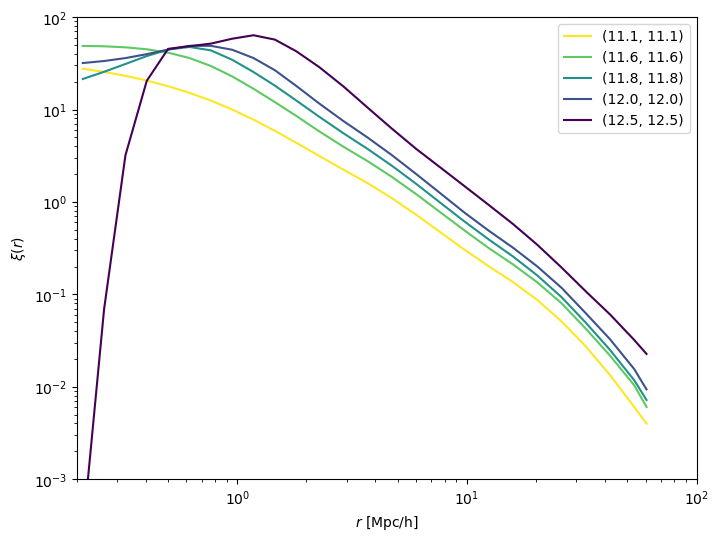

In [10]:
import matplotlib.pyplot as plt


fig, ax = plt.subplots(1, 1, figsize=(8, 6))
mpair = [(11.1, 11.1), (11.6, 11.6), (11.8, 11.8),  (12.0, 12.0), (12.5, 12.5)]

viridis = plt.get_cmap('viridis', len(mpair)).reversed()
for i in range(len(mpair)):
    cosmo = (emu.cosmo_min + emu.cosmo_max)/2.0
    xi_pred, var_pred = emu.predict_xi(mpair[i][0], mpair[i][1], cosmo[:,np.newaxis])
    ind = np.where((emu.mass_pairs[:, 0] == mpair[i][0]) * (emu.mass_pairs[:, 1] == mpair[i][1]))[0]
    ax.plot(emu.rbins, 10**xi_pred.squeeze(), label=f'{mpair[i]}', color=viridis(i / len(mpair)))
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(2e-1, 1e2)
ax.set_ylim(1e-3, 1e2)
ax.set_xlabel(r'$r$ [Mpc/h]')
ax.set_ylabel(r'$\xi(r)$')
ax.legend()

2025-04-06 20:38:58.713607: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-06 20:38:58.716804: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-06 20:38:58.726682: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1743989938.742782  123167 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1743989938.747575  123167 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-06 20:38:58.764979: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Text(0.5, 1.0, 'mpair = [11.6 11.6]')

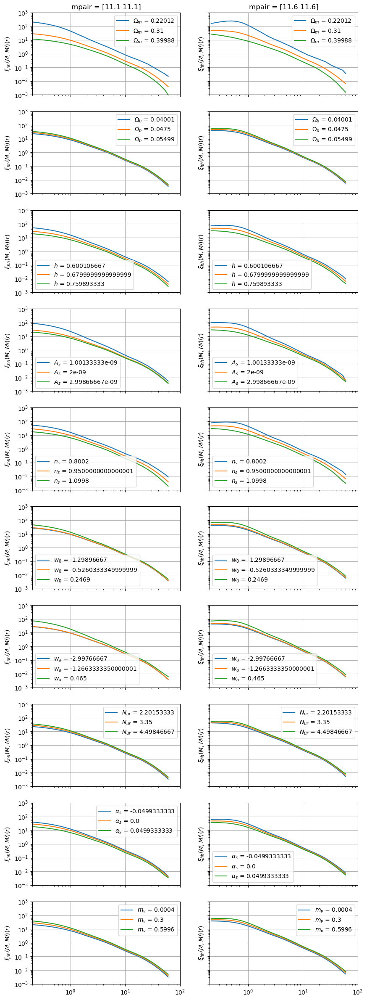

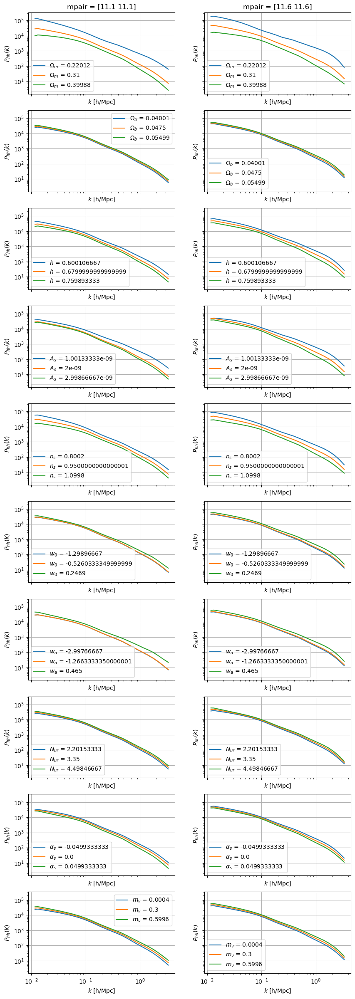

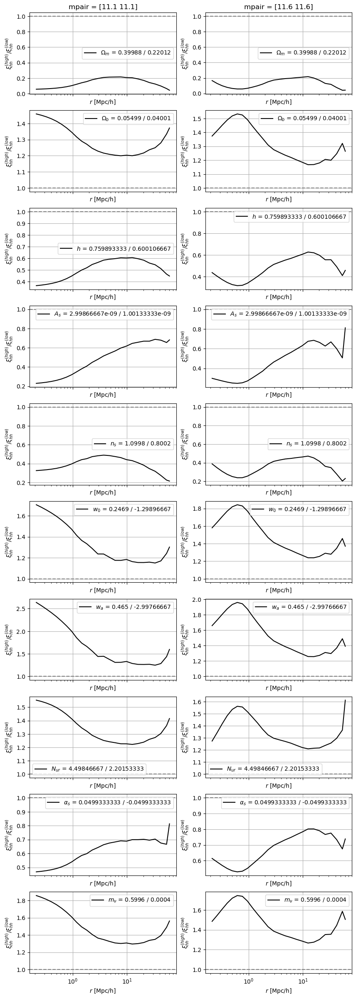

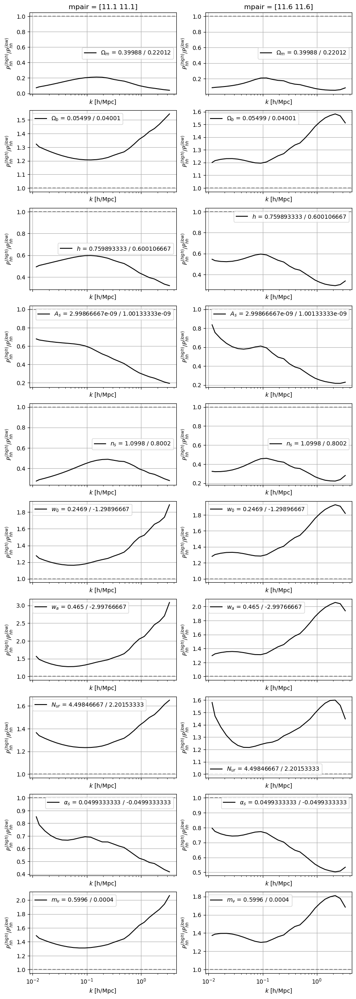

In [ ]:
from gal_goku import emu_cosmo_not_combined
import importlib
importlib.reload(emu_cosmo_not_combined)
import numpy as np
import matplotlib.pyplot as plt
import mcfit

params=['omega0', 'omegab', 'hubble', 'scalar_amp', 'ns', 
        'w0_fld', 'wa_fld', 'N_ur', 'alpha_s', 
        'm_nu']
latex_labels = {'omega0': r'$\Omega_m$', 'omegab': r'$\Omega_b$', 
                             'hubble': r'$h$', 'scalar_amp': r'$A_s$', 'ns': r'$n_s$', 
                             'w0_fld': r'$w_0$', 'wa_fld': r'$w_a$', 'N_ur': r'$N_{ur}$', 
                             'alpha_s': r'$\alpha_s$', 'm_nu': r'$m_{\nu}$'}

order_ratio = [(1,2), (2,1), (1,2), (2,1)]
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
emu = emu_cosmo_not_combined.XiEmulator(dat_dir=data_dir, loggin_level='ERROR')

cosmo_mid = (emu.cosmo_min + emu.cosmo_max)/2.0
all_mass_pairs = np.array([(11.1, 11.1), (11.6, 11.6)])


fig, axes = plt.subplots(len(cosmo_mid), 2, figsize=(10, 3 * len(cosmo_mid)), sharex=True, sharey=True)
fig_pk, axes_pk = plt.subplots(len(cosmo_mid), 2, figsize=(10, 3 * len(cosmo_mid)), sharex=True, sharey=True)
fig_ratio, axes_ratio = plt.subplots(len(cosmo_mid), 2, figsize=(10, 3 * len(cosmo_mid)), sharex=True, sharey=False)
fig_pk_ratio, axes_pk_ratio = plt.subplots(len(cosmo_mid), 2, figsize=(10, 3 * len(cosmo_mid)), sharex=True, sharey=False)

for m in range(len(all_mass_pairs)):
    for i in range(len(cosmo_mid)):
        cosmo_low = cosmo_mid.copy()
        cosmo_low[i] = emu.cosmo_min[i]
        cosmo_high = cosmo_mid.copy()
        cosmo_high[i] = emu.cosmo_max[i]
        all_cosmos = np.array([cosmo_low, cosmo_mid, cosmo_high])
        
        xi_preds = []
        phhs = []
        for c in range(len(all_cosmos)):
            xi_pred, var_pred = emu.predict_xi(all_mass_pairs[m][0], all_mass_pairs[m][1], all_cosmos[c][:, np.newaxis])
            k, phh = mcfit.xi2P(emu.rbins, l=0, lowring=True)(xi_pred, extrap=True)
            xi_preds.append(xi_pred.squeeze())
            phhs.append(phh.squeeze())
            #axes[i, m].errorbar(emu.rbins, xi_pred.squeeze(), yerr=np.sqrt(var_pred.squeeze()), 
            #                    label=rf'{latex_labels[params[i]]} = {all_cosmos[c][i]}', color=f'C{c}', capsize=3, alpha=0.7)
            axes[i, m].plot(emu.rbins, xi_pred.squeeze(), label=rf'{latex_labels[params[i]]} = {all_cosmos[c][i]}', color=f'C{c}')
            axes_pk[i, m].plot(k, phh.squeeze(), label=rf'{latex_labels[params[i]]} = {all_cosmos[c][i]}', color=f'C{c}')
            axes[i, m].set_xscale('log')
            axes[i, m].set_yscale('log')
            axes[i, m].set_xlim(2e-1, 1e2)
            axes[i, m].set_ylim(1e-3, 1e3)
            axes[i, m].set_ylabel(r'$\xi_{hh}(M, M\prime)(r)$')
            axes[i,m].grid(True)
            axes[i,m].legend()
            axes_pk[i,m].set_ylabel(r'$P_{hh}(k)$')
            axes_pk[i,m].set_xlabel(r'$k$ [h/Mpc]')
            axes_pk[i, m].set_xscale('log')
            axes_pk[i, m].set_yscale('log')
            axes_pk[i, m].grid(True)
            axes_pk[i, m].legend()
        axes[0, m].set_title(f'mpair = {all_mass_pairs[m]}')
        axes_pk[0, m].set_title(f'mpair = {all_mass_pairs[m]}')
        
        # Plot ratio for xi_pred
        ratio_xi = xi_preds[2] / xi_preds[3]
        label_ratio = rf'{latex_labels[params[i]]} = {all_cosmos[2][i]} / {all_cosmos[0][i]}'
        axes_ratio[i, m].plot(emu.rbins, ratio_xi, label=label_ratio, color='black')
        axes_ratio[i, m].axhline(1, color='gray', linestyle='--')
        axes_ratio[i, m].set_xscale('log')
        axes_ratio[i, m].set_xlabel(r'$r$ [Mpc/h]')
        axes_ratio[i, m].set_ylabel(r'$\xi_{hh}^{(high)}/\xi_{hh}^{(low)}$')
        axes_ratio[i, m].grid(True)
        axes_ratio[i, m].legend()
        
        # Plot ratio for phh
        ratio_phh = phhs[2] / phhs[3]
        axes_pk_ratio[i, m].plot(k, ratio_phh, label=label_ratio, color='black')
        axes_pk_ratio[i, m].axhline(1, color='gray', linestyle='--')
        axes_pk_ratio[i, m].set_xscale('log')
        axes_pk_ratio[i, m].set_xlabel(r'$k$ [h/Mpc]')
        axes_pk_ratio[i, m].set_ylabel(r'$P_{hh}^{(high)}/P_{hh}^{(low)}$')
        axes_pk_ratio[i, m].grid(True)
        axes_pk_ratio[i, m].legend()

axes_ratio[0, 0].set_title(f'mpair = {all_mass_pairs[0]}')
axes_pk_ratio[0, 0].set_title(f'mpair = {all_mass_pairs[0]}')
axes_ratio[0, 1].set_title(f'mpair = {all_mass_pairs[1]}')
axes_pk_ratio[0, 1].set_title(f'mpair = {all_mass_pairs[1]}')


## Check cosmo sensitivity on the sims:

/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/summary_stats.py:591: RuntimeWarning: invalid value encountered in log10
  log_corr = np.log10(self.xi[:,ind_m,ind_r]).squeeze()


[[ 2.74840000e-01  4.45700000e-02  6.49920000e-01  1.60266667e-09
   8.90600000e-01 -8.35000000e-01 -1.93600000e+00  2.89306667e+00
  -2.02666667e-02  1.80000000e-01]
 [ 3.10000000e-01  4.74400000e-02  6.78933333e-01  2.01333333e-09
   9.50800000e-01 -5.40500000e-01 -1.25233333e+00  3.34540000e+00
  -2.66666667e-04  2.97200000e-01]
 [ 3.47440000e-01  5.05300000e-02  7.12426667e-01  2.39733333e-09
   1.00920000e+00 -2.31533333e-01 -6.06000000e-01  3.80386667e+00
   2.01333333e-02  4.23200000e-01]]


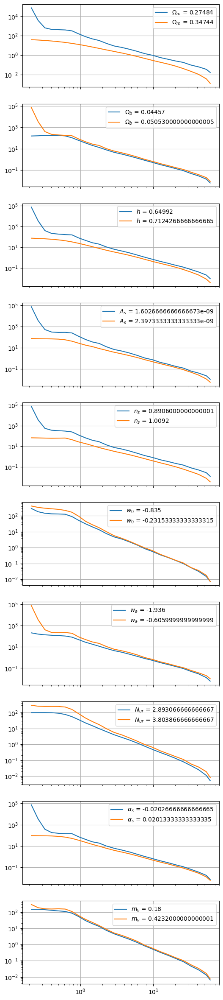

In [16]:
from matplotlib import pyplot as plt
from gal_goku import summary_stats
import numpy as np

params=['omega0', 'omegab', 'hubble', 'scalar_amp', 'ns', 
        'w0_fld', 'wa_fld', 'N_ur', 'alpha_s', 
        'm_nu']
latex_labels = {'omega0': r'$\Omega_m$', 'omegab': r'$\Omega_b$', 
                             'hubble': r'$h$', 'scalar_amp': r'$A_s$', 'ns': r'$n_s$', 
                             'w0_fld': r'$w_0$', 'wa_fld': r'$w_a$', 'N_ur': r'$N_{ur}$', 
                             'alpha_s': r'$\alpha_s$', 'm_nu': r'$m_{\nu}$'}

data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
mass_pair = (11.4, 11.4)
xi = summary_stats.Xi(data_dir=data_dir, fid='L2',  logging_level='ERROR')
rbins, _, corr, bad_sims_mask = xi.spline_nan_interp(mass_pair, rcut=(0.2,61))
cosmos = xi.get_params_array()[~bad_sims_mask]
corr = corr[~bad_sims_mask]
percent = np.percentile(cosmos, [30, 50, 70], axis=0)
print(percent)
fig, ax = plt.subplots(10, 1, figsize=(6, 30), sharex=True)
for i in range(10):
    ind = np.where(cosmos[:,i] <= percent[0,i])[0]
    xi_low = np.mean(10**corr[ind,:], axis=0)
    ind = np.where(cosmos[:,i] >= percent[2,i])[0]
    xi_high = np.mean(10**corr[ind,:], axis=0)

    
    ax[i].plot(rbins, xi_low, label=rf'{latex_labels[params[i]]} = {percent[0,i]}')
    ax[i].plot(rbins, xi_high, label=rf'{latex_labels[params[i]]} = {percent[2,i]}')
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].legend()
    ax[i].grid(True)


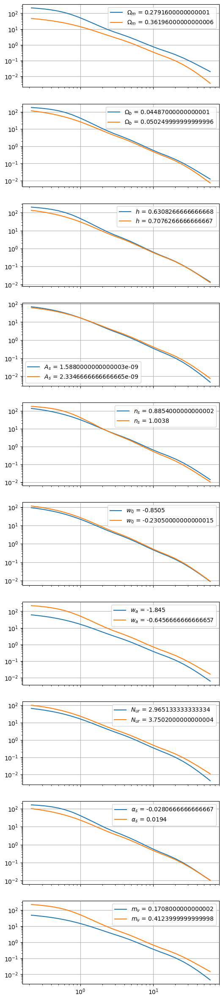

In [17]:
from matplotlib import pyplot as plt
from gal_goku import summary_stats
import numpy as np

params=['omega0', 'omegab', 'hubble', 'scalar_amp', 'ns', 
        'w0_fld', 'wa_fld', 'N_ur', 'alpha_s', 
        'm_nu']
latex_labels = {'omega0': r'$\Omega_m$', 'omegab': r'$\Omega_b$', 
                             'hubble': r'$h$', 'scalar_amp': r'$A_s$', 'ns': r'$n_s$', 
                             'w0_fld': r'$w_0$', 'wa_fld': r'$w_a$', 'N_ur': r'$N_{ur}$', 
                             'alpha_s': r'$\alpha_s$', 'm_nu': r'$m_{\nu}$'}

data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
mass_pair = (11.4, 11.4)
xi = summary_stats.Xi(data_dir=data_dir, fid='HF', narrow=False,  logging_level='ERROR')
rbins, _, corr, bad_sims_mask = xi.spline_nan_interp(mass_pair, rcut=(0.2,61))
cosmos = xi.get_params_array()[~bad_sims_mask]
corr = corr[~bad_sims_mask]
percent = np.percentile(cosmos, [30, 50, 70], axis=0)
fig, ax = plt.subplots(10, 1, figsize=(6, 30), sharex=True)
for i in range(10):
    ind = np.where(cosmos[:,i] <= percent[0,i])[0]
    xi_low = np.mean(10**corr[ind,:], axis=0)
    ind = np.where(cosmos[:,i] >= percent[2,i])[0]
    xi_high = np.mean(10**corr[ind,:], axis=0)

    
    ax[i].plot(rbins, xi_low, label=rf'{latex_labels[params[i]]} = {percent[0,i]}')
    ax[i].plot(rbins, xi_high, label=rf'{latex_labels[params[i]]} = {percent[2,i]}')
    ax[i].set_xscale('log')
    ax[i].set_yscale('log')
    ax[i].legend()
    ax[i].grid(True)


In [1]:
from matplotlib import pyplot as plt
from gal_goku import summary_stats
import numpy as np

params=['omega0', 'omegab', 'hubble', 'scalar_amp', 'ns', 
        'w0_fld', 'wa_fld', 'N_ur', 'alpha_s', 
        'm_nu']
latex_labels = {'omega0': r'$\Omega_m$', 'omegab': r'$\Omega_b$', 
                             'hubble': r'$h$', 'scalar_amp': r'$A_s$', 'ns': r'$n_s$', 
                             'w0_fld': r'$w_0$', 'wa_fld': r'$w_a$', 'N_ur': r'$N_{ur}$', 
                             'alpha_s': r'$\alpha_s$', 'm_nu': r'$m_{\nu}$'}

data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
mass_pair = (11.4, 11.4)
xi = summary_stats.Xi(data_dir=data_dir, fid='L2',  logging_level='ERROR')
rbins, _, corr, bad_sims_mask = xi.spline_nan_interp(mass_pair, rcut=(0.2,61))
cosmos = xi.get_params_array()[~bad_sims_mask]
corr = corr[~bad_sims_mask]

2025-04-07 10:48:34.258505: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-07 10:48:34.261308: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-07 10:48:34.270779: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744040914.286573  149611 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744040914.291346  149611 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-07 10:48:34.308016: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

In [11]:
cosmos[-2]

array([ 3.17080000e-01,  5.13300000e-02,  7.51360000e-01,  1.07066667e-09,
        9.41800000e-01, -4.49566667e-01, -5.76666667e-02,  2.60326667e+00,
       -3.33333333e-04,  1.04400000e-01])

In [10]:
xi.sim_tags[-2]

'compressed_10p_Box250_Part750_0562'

## linear power:

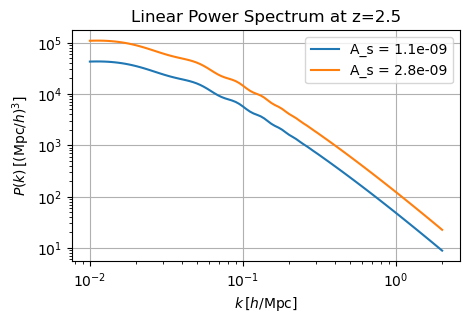

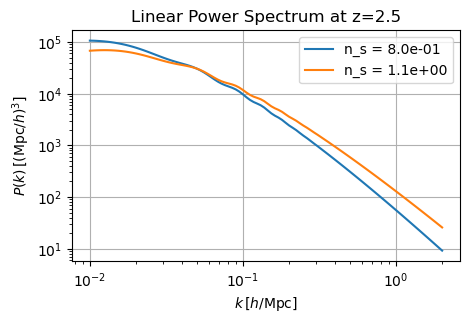

In [16]:
from classy import Class
import numpy as np
import matplotlib.pyplot as plt

# Define cosmological parameters
params = {
    'output': 'mPk',
    'P_k_max_h/Mpc': 10,
    'z_pk': '2.5',
    'A_s': 2.1e-9,
    'n_s': 0.965,
    'h': 0.67,
    'omega_b': 0.022,
    'omega_cdm': 0.12,
}

Aps = [1.1e-9, 2.8e-9]
fig ,ax = plt.subplots(1, 1, figsize=(5, 3))
for i in range(2):
    params_new = params.copy()
    params_new['A_s'] = Aps[i]
    # Initialize CLASS
    cosmo = Class()
    cosmo.set(params_new)
    cosmo.compute()


    # Get P(k) at z=0
    k_vals = np.logspace(-2, np.log10(2), 100)  # in h/Mpc
    pk_vals = [cosmo.pk(k, 0) for k in k_vals]  # z=0

    # Plot
    ax.loglog(k_vals, pk_vals, label=f'A_s = {Aps[i]:.1e}')
    ax.set_xlabel(r'$k \, [h/\mathrm{Mpc}]$')
    ax.set_ylabel(r'$P(k) \, [(\mathrm{Mpc}/h)^3]$')
    ax.set_title('Linear Power Spectrum at z=2.5')
    ax.grid(True)
    ax.legend()

    # Clean up
    cosmo.struct_cleanup()
    cosmo.empty()

# Define cosmological parameters
params = {
    'output': 'mPk',
    'P_k_max_h/Mpc': 10,
    'z_pk': '2.5',
    'A_s': 2.1e-9,
    'n_s': 0.965,
    'h': 0.67,
    'omega_b': 0.022,
    'omega_cdm': 0.12,
}

ns = [0.8, 1.08]
fig ,ax = plt.subplots(1, 1, figsize=(5, 3))
for i in range(2):
    params_new = params.copy()
    params_new['n_s'] = ns[i]
    # Initialize CLASS
    cosmo = Class()
    cosmo.set(params_new)
    cosmo.compute()


    # Get P(k) at z=0
    k_vals = np.logspace(-2, np.log10(2), 100)  # in h/Mpc
    pk_vals = [cosmo.pk(k, 0) for k in k_vals]  # z=0

    # Plot
    ax.loglog(k_vals, pk_vals, label=f'n_s = {ns[i]:.1e}')
    ax.set_xlabel(r'$k \, [h/\mathrm{Mpc}]$')
    ax.set_ylabel(r'$P(k) \, [(\mathrm{Mpc}/h)^3]$')
    ax.set_title('Linear Power Spectrum at z=2.5')
    ax.grid(True)
    ax.legend()

    # Clean up
    cosmo.struct_cleanup()
    cosmo.empty()



## Get $\xi_{gg}(\vec{\Theta})$:

1. Evaluate $\xi_{hh}$ and $hmf$ emualtors
2. Evaluate the HOd parameters
3. Convolve 1 and 2

## $dn/dM$:

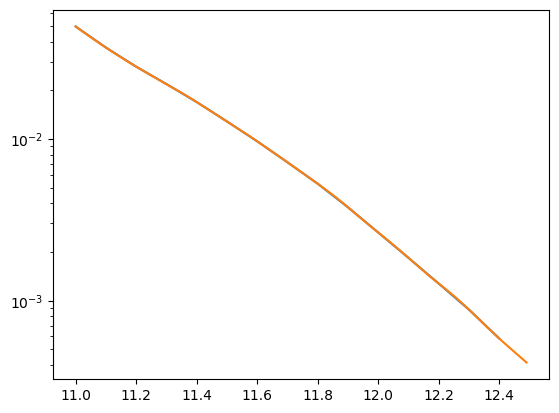

In [18]:
m = np.arange(11.0, 12.5, 0.1)
plt.plot(m, g.dndm(m))
m = np.arange(11.0, 12.5, 0.01)
plt.plot(m, g.dndm(m))
plt.yscale('log')


In [ ]:
g.mth_to_dens(12.5), g.mth_to_dens(11.5)

(8.321314534323241e-05, 0.004029801025430579)

## $\xi_{hh, m_1, m_2}$

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()
g = gal.Gal(logging_level='DEBUG')
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-04-29 15:50:52.435456: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-29 15:50:52.438701: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-04-29 15:50:52.448692: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745959852.464600  498851 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745959852.469407  498851 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-29 15:50:52.486727: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Execution time for one cosmology : 16.1491 seconds


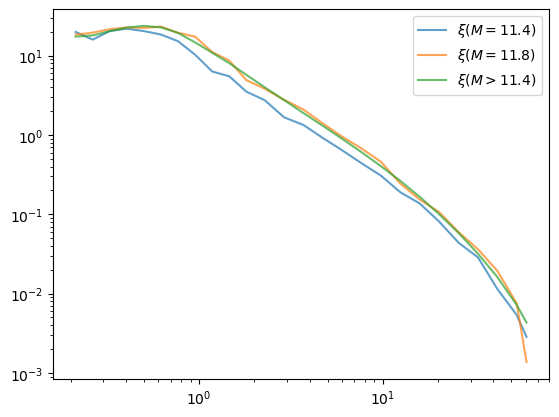

In [2]:
xi_hh_m1_m2 = g.xi_hh_m1m2([11.4, 11.4])
plt.plot(g.xi_emu.rbins, xi_hh_m1_m2, label=r'$\xi (M = 11.4)$', alpha=0.7)
xi_hh_m1_m2 = g.xi_hh_m1m2([11.8, 11.8])
plt.plot(g.rbins, xi_hh_m1_m2, label=r'$\xi (M = 11.8)$', alpha=0.7)
xi_hh_mth = g.xi_hh_mth(11.4, 11.4)
plt.plot(g.rbins, xi_hh_mth, label=r'$\xi (M >11.4)$', alpha=0.7)
plt.xscale('log')
plt.yscale('log')
plt.legend()

In [5]:
# Omega_m:
i = 0
cosmo_h = cosmo_test.copy()
cosmo_l = cosmo_test.copy()
cosmo_h[i] = cosmo_test[i] + (g.xi_emu.cosmo_max[i] - g.xi_emu.cosmo_min)[i]/4
cosmo_l[i] = cosmo_test[i] - (g.xi_emu.cosmo_max[i] - g.xi_emu.cosmo_min)[i]/4

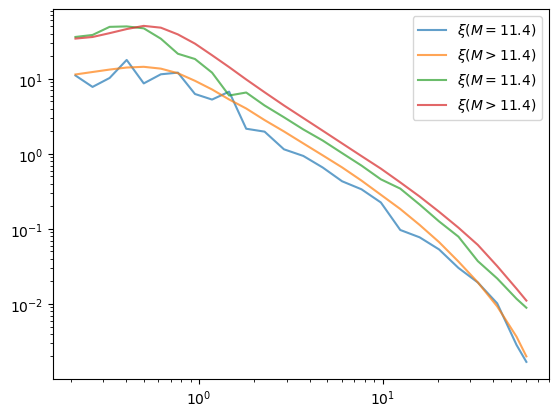

In [ ]:
g.reset_cosmo(cosmo_h)
xi_hh_m1_m2 = g.xi_hh_m1m2([11.4, 11.4])
plt.plot(g.xi_emu.rbins, xi_hh_m1_m2, label=r'$\xi (M = 11.4)$', alpha=0.7)

xi_hh_mth = g.xi_hh_mth(11.4, 11.4)
plt.plot(g.rbins, xi_hh_mth, label=r'$\xi (M >11.4)$', alpha=0.7)


g.reset_cosmo(cosmo_l)
xi_hh_m1_m2 = g.xi_hh_m1m2([11.4, 11.4])
plt.plot(g.xi_emu.rbins, xi_hh_m1_m2, label=r'$\xi (M = 11.4)$', alpha=0.7)

xi_hh_mth = g.xi_hh_mth(11.4, 11.4)
plt.plot(g.rbins, xi_hh_mth, label=r'$\xi (M >11.4)$', alpha=0.7)
plt.xscale('log')
plt.yscale('log')
plt.legend()

## $P_{hh, M_1, M_2}$:

In [10]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()
g = gal.Gal(logging_level='DEBUG')
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_cosmo(cosmo_test)
g.reset_hod()
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

Execution time for one cosmology : 12.5446 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


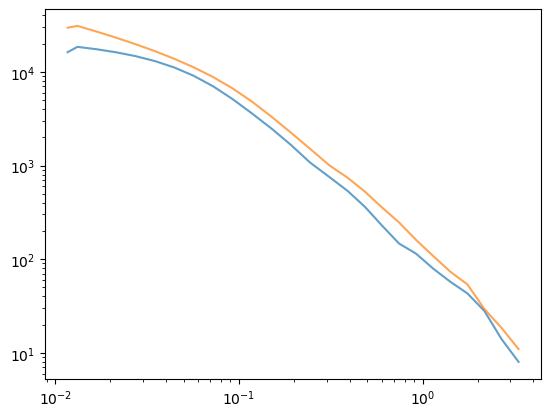

In [19]:
k, phh_m1m2 = g.p_hh_m1m2([11.3, 11.3])
plt.plot(k, phh_m1m2, label='p_hh_m1m2 at 11.3', alpha=0.7)
k, phh_m1m2 = g.p_hh_m1m2([11.6, 11.6])
plt.plot(k, phh_m1m2, label='p_hh_m1m2 at 11.6', alpha=0.7)
plt.xscale('log')
plt.yscale('log')


# HOD:

## Verify $N_c$ - $N_s$:

In [7]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()
g = gal.Gal(logging_level='DEBUG')
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

Execution time for one cosmology : 1.5763 seconds


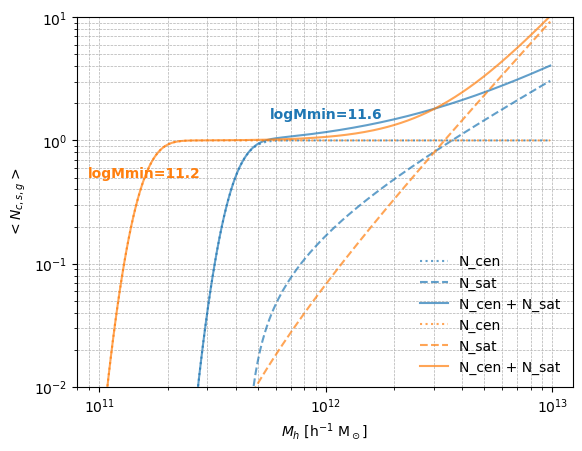

In [6]:
logMh = np.arange(11.0, 13, 0.01)

hod_params = {
            # Center galaxy parameters
            'logMmin': 11.6,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 1.03
                }

g.reset_hod(hod_params)
N_cen = g._Ncen(logMh)
N_sat = g._Nsat(logMh)
N_g = N_cen + N_sat
plt.plot(10**logMh, N_cen, label='N_cen', alpha=0.7, ls='dotted', color='C0')
plt.plot(10**logMh, N_sat, label='N_sat', alpha=0.7, ls='--', color='C0')
plt.plot(10**logMh, N_g, label='N_cen + N_sat', alpha=0.7, color='C0')

# Add a header for the group of labels
plt.text(10**12, 1.5, 'logMmin=11.6', color='C0', fontsize=10, fontweight='bold', ha='center')

hod_params = {
    # Central galaxy parameters
    'logMmin': 11.2,
    'sig_logM': 0.1,
    #'alpha_inc': 0.5,
    #'Minc': 12.0,
    # Satellite galaxy parameters
    'M1': 12.5,
    'kappa': 1.1,
    'alpha': 2.0
    }
g.reset_hod(hod_params)

N_cen = g._Ncen(logMh)
N_sat = g._Nsat(logMh)
N_g = N_cen + N_sat
plt.plot(10**logMh, N_cen, label='N_cen', alpha=0.7, ls='dotted', color='C1')
plt.plot(10**logMh, N_sat, label='N_sat', alpha=0.7, ls='--', color='C1')
plt.plot(10**logMh, N_g, label='N_cen + N_sat', alpha=0.7, color='C1')

# Add a header for the group of labels
plt.text(10**11.2, 0.5, 'logMmin=11.2', color='C1', fontsize=10, fontweight='bold', ha='center')
plt.yscale('log')
plt.xscale('log')
plt.xlabel(r'$M_h$ [h$^{-1}$ M$_\odot$]')
plt.ylabel(r'$<N_{c,s,g}>$')
plt.ylim(1e-2, 1e1)
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend(framealpha=0)

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()
g = gal.Gal(logging_level='DEBUG')
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-19 14:48:32.563755: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-19 14:48:32.566940: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-19 14:48:32.576269: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747684112.591284 1141841 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747684112.595843 1141841 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747684112.608466 1141841 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

XiEmulator | 05/19/2025 02:48:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/19/2025 02:48:35 PM | DEBUG  |  Loading the emulators from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl


2025-05-19 14:48:35.542356: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-19 14:48:35.666278: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 40080000 exceeds 10% of free system memory.
2025-05-19 14:48:36.201060: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 80000000 exceeds 10% of free system memory.
2025-05-19 14:48:36.248307: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 79840000 exceeds 10% of free system memory.
2025-05-19 14:48:36.257092: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 79840000 exceeds 10% of free system memory.
2025-05-19 14:48:36.265849: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 79840000 exceeds 10% of free system memory.


XiEmulator | 05/19/2025 02:48:36 PM | DEBUG  |   num_outputs: 2730, num_latents: 40, num_inducing: 500, num_params: 10
gal.XiGal | 05/19/2025 02:48:36 PM | DEBUG  |  Emulators mass bins: [11.  11.1 11.2 11.3 11.4 11.5 11.6 11.7 11.8 11.9 12.  12.1 12.2 12.3]
gal.XiGal | 05/19/2025 02:48:36 PM | DEBUG  |  Emulators rbins.size: 26
BaseEmulator | 05/19/2025 02:48:36 PM | INFO  |  Loading the hmf emulator from /home/qezlou/HD2/HETDEX/cosmo/data/HMF/train/hmf_emu_combined_inducing_500_latents_20_leave31.pkl
BaseEmulator | 05/19/2025 02:48:36 PM | DEBUG  |  Loading the emulators from /home/qezlou/HD2/HETDEX/cosmo/data/HMF/train/hmf_emu_combined_inducing_500_latents_20_leave31.pkl
BaseEmulator | 05/19/2025 02:48:37 PM | DEBUG  |   num_outputs: 24, num_latents: 20, num_inducing: 500, num_params: 10
Execution time for one cosmology : 1.7244 seconds


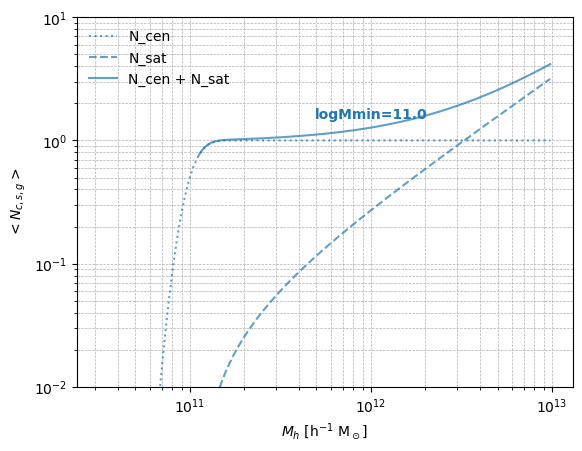

In [14]:
logMh = np.arange(10.5, 13, 0.01)

hod_params = {
            # Center galaxy parameters
            'logMmin': 11.0,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 1.03
                }

g.reset_hod(hod_params)
N_cen = g._Ncen(logMh)
N_sat = g._Nsat(logMh)
N_g = N_cen + N_sat
plt.plot(10**logMh, N_cen, label='N_cen', alpha=0.7, ls='dotted', color='C0')
plt.plot(10**logMh, N_sat, label='N_sat', alpha=0.7, ls='--', color='C0')
plt.plot(10**logMh, N_g, label='N_cen + N_sat', alpha=0.7, color='C0')

# Add a header for the group of labels
plt.text(10**12, 1.5, 'logMmin=11.0', color='C0', fontsize=10, fontweight='bold', ha='center')



plt.yscale('log')
plt.xscale('log')
plt.xlabel(r'$M_h$ [h$^{-1}$ M$_\odot$]')
plt.ylabel(r'$<N_{c,s,g}>$')
plt.ylim(1e-2, 1e1)
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend(framealpha=0)

In [2]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

g = gal.Gal(logging_level='DEBUG')
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
logMh = np.arange(11.0, 13, 0.01)
g.config['logMh'] = logMh
g.reset_hod()
g.reset_cosmo(cosmo_test)

2025-05-02 14:36:22.201737: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 14:36:22.204927: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 14:36:22.214891: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746214582.230912  680433 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746214582.235703  680433 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-02 14:36:22.252780: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

(1e-06, 0.01)

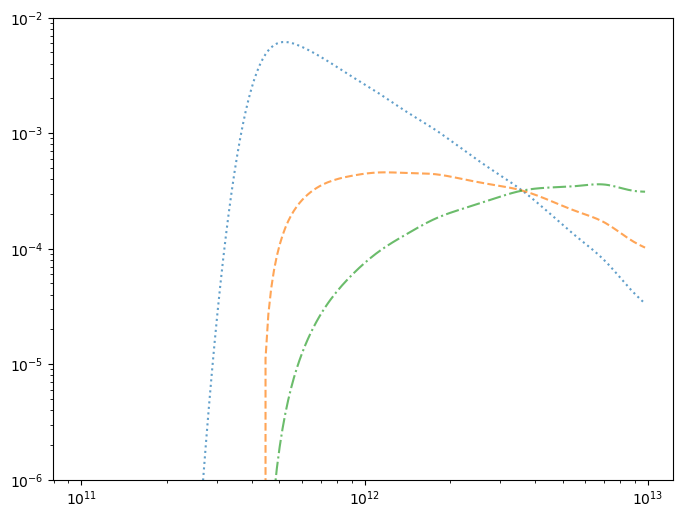

In [37]:
from scipy.integrate import quad

g.reset_cosmo(cosmo_test)
hod_params = {
            # Center galaxy parameters
            'logMmin': 11.6,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 1.03
                }

g.reset_hod(hod_params)
integrand = lambda x: g._Ncen(x) * g._Ncen(x) * g.dndlog_m(x)
conv_cen = []
for i in range(len(logMh)):
    conv_cen.append(integrand(logMh[i]))
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.plot(10**logMh, conv_cen, label='N_cen', alpha=0.7, ls='dotted', color='C0')
ax.set_xscale('log')

integrand = lambda x: g._Ncen(x) * g._Nsat(x) * g.dndlog_m(x)
conv_cen_sat = []
for i in range(len(logMh)):
    conv_cen_sat.append(integrand(logMh[i]))
ax.plot(10**logMh, conv_cen_sat, label='N_cen', alpha=0.7, ls='--', color='C1')
ax.set_xscale('log')
ax.set_yscale('log')


integrand = lambda x: g._Nsat(x) * g._Nsat(x) * g.dndlog_m(x)
conv_sat_sat = []
for i in range(len(logMh)):
    conv_sat_sat.append(integrand(logMh[i]))
ax.plot(10**logMh, conv_sat_sat, label='N_cen', alpha=0.7, ls='-.', color='C2')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_ylim(1e-6, 1e-2)

In [12]:
(conv_cen[1:] - conv_cen[:-1]).shape, logMh.shape

((199,), (200,))

In [33]:
g.dndlog_m(11.5), g.dndlog_m(12), g.dndlog_m(13)

(0.01285436246469685, 0.0026415490912937455, 3.183047017341935e-05)

In [34]:
g._Ncen(11.5), g._Ncen(12), g._Ncen(13)

(0.07864960352514339, 0.999999992291371, 1.0)

In [24]:
g._Ncen(11.7)*g.dndlog_m(11.7), g._Ncen(12)*g.dndlog_m(12)

(0.006609379007079757, 0.0026415490709310236)

#### The weghts for $P_{gg, cc}$, $P_{gg, cs}$, $P_{gg,ss}$:

In [ ]:
logMh = np.arange(11.0, 13, 0.01)

hod_params = {
            # Center galaxy parameters
            'logMmin': 11.6,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 1.03
                }

g.reset_hod(hod_params)
N_cen = g._Ncen(logMh)
N_sat = g._Nsat(logMh)
N_g = N_cen + N_sat
plt.plot(10**logMh, N_cen, label='N_cen', alpha=0.7, ls='dotted', color='C0')
plt.plot(10**logMh, N_sat, label='N_sat', alpha=0.7, ls='--', color='C0')
plt.plot(10**logMh, N_g, label='N_cen + N_sat', alpha=0.7, color='C0')

# Add a header for the group of labels
plt.text(10**12, 1.5, 'logMmin=11.6', color='C0', fontsize=10, fontweight='bold', ha='center')

hod_params = {
    # Central galaxy parameters
    'logMmin': 11.2,
    'sig_logM': 0.1,
    #'alpha_inc': 0.5,
    #'Minc': 12.0,
    # Satellite galaxy parameters
    'M1': 12.5,
    'kappa': 1.1,
    'alpha': 2.0
    }
g.reset_hod(hod_params)

N_cen = g._Ncen(logMh)
N_sat = g._Nsat(logMh)
N_g = N_cen + N_sat
plt.plot(10**logMh, N_cen, label='N_cen', alpha=0.7, ls='dotted', color='C1')
plt.plot(10**logMh, N_sat, label='N_sat', alpha=0.7, ls='--', color='C1')
plt.plot(10**logMh, N_g, label='N_cen + N_sat', alpha=0.7, color='C1')

# Add a header for the group of labels
plt.text(10**11.2, 0.5, 'logMmin=11.2', color='C1', fontsize=10, fontweight='bold', ha='center')
plt.yscale('log')
plt.xscale('log')
plt.xlabel(r'$M_h$ [h$^{-1}$ M$_\odot$]')
plt.ylabel(r'$<N_{c,s,g}>$')
plt.ylim(1e-2, 1e1)
plt.grid(which='both', linestyle='--', linewidth=0.5)
plt.legend(framealpha=0)

(False, False, False)

## $P_{gg, cc}$:

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.8, 0.05),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2


g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-02 12:55:43.132083: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 12:55:43.135348: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 12:55:43.145376: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746208543.161638  666864 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746208543.166519  666864 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-02 12:55:43.184163: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Execution time for one cosmology : 16.0145 seconds


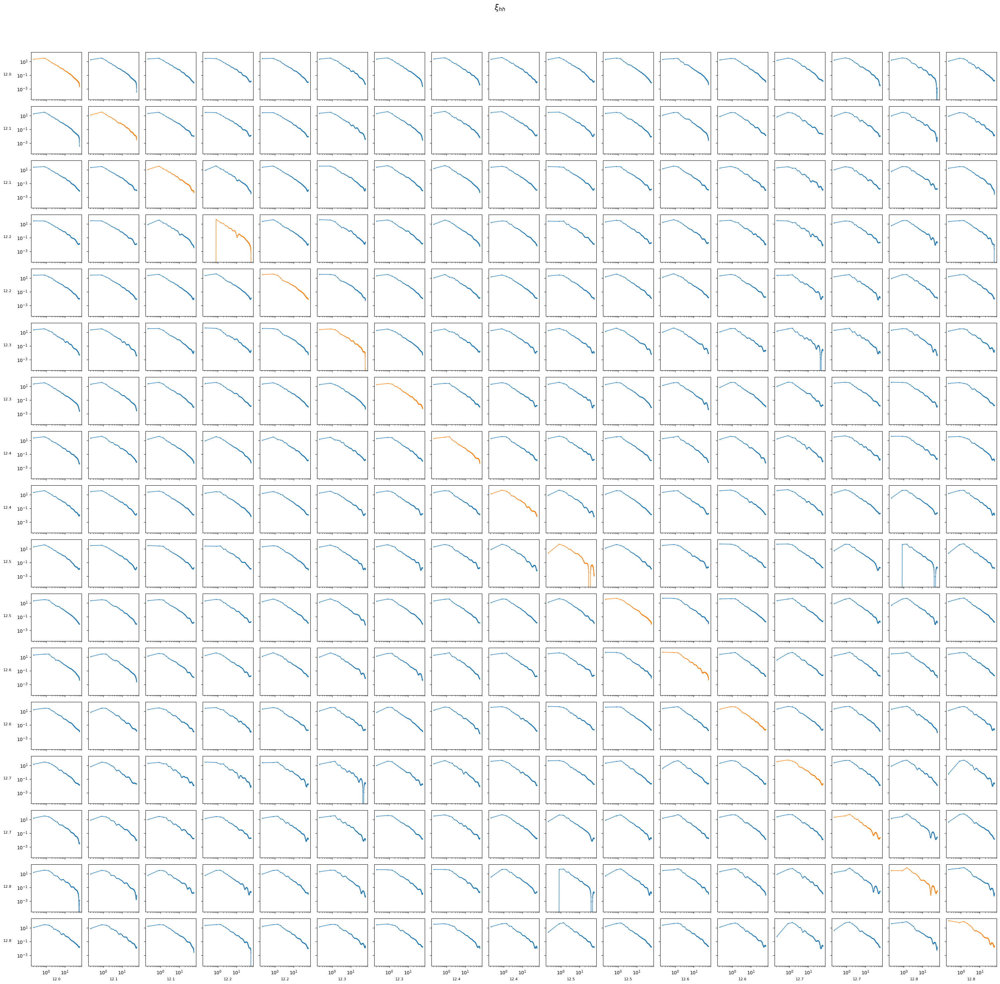

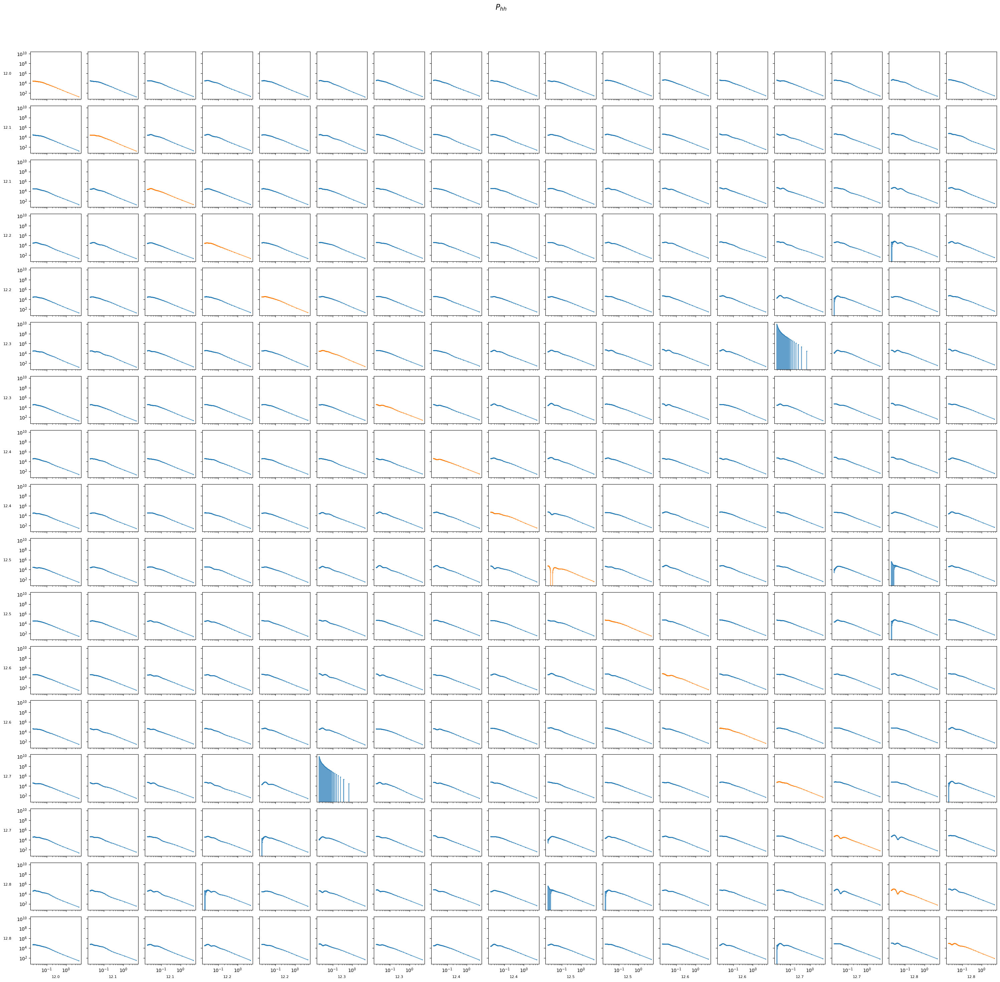

In [4]:
# Filter logMh to only include values >= 12
logMh = g.config['logMh']
logMh_filtered = logMh[logMh >= 12]

# Create a matrix of subplots for xi_hh
fig_xi, axes_xi = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_xi.suptitle(r'$\xi_{hh}$', fontsize=16)

# Create a matrix of subplots for p_hh
fig_phh, axes_phh = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_phh.suptitle(r'$P_{hh}$', fontsize=16)

for i, m1 in enumerate(logMh_filtered):  
    for j, m2 in enumerate(logMh_filtered):  
        # Plot xi_hh
        xi_hh = g.xi_hh_m1m2([m1, m2])
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_xi[i, j].plot(g.rbins_fine, xi_hh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_xi[i, j].set_xscale('log')
        axes_xi[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_xi[i, j].set_xlabel(r'$r$ [Mpc/h]')
        if j == 0:
            axes_xi[i, j].set_ylabel(r'$\xi(r)$')

        # Plot p_hh
        k, phh = g.p_hh_m1m2([m1, m2])
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_phh[i, j].plot(k, phh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_phh[i, j].set_xscale('log')
        axes_phh[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_phh[i, j].set_xlabel(r'$k$ [h/Mpc]')
        if j == 0:
            axes_phh[i, j].set_ylabel(r'$P(k)$')

# Add mass labels to the rows and columns
for ax, m in zip(axes_xi[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_xi[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

for ax, m in zip(axes_phh[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_phh[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

# Adjust layout for better spacing
fig_xi.tight_layout(rect=[0, 0, 1, 0.95])
fig_phh.tight_layout(rect=[0, 0, 1, 0.95])

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 13, 0.1),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2


g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-02 15:15:58.445056: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 15:15:58.448301: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-02 15:15:58.458331: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746216958.474664  682281 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746216958.479545  682281 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-02 15:15:58.497384: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU ins

Execution time for one cosmology : 16.0037 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


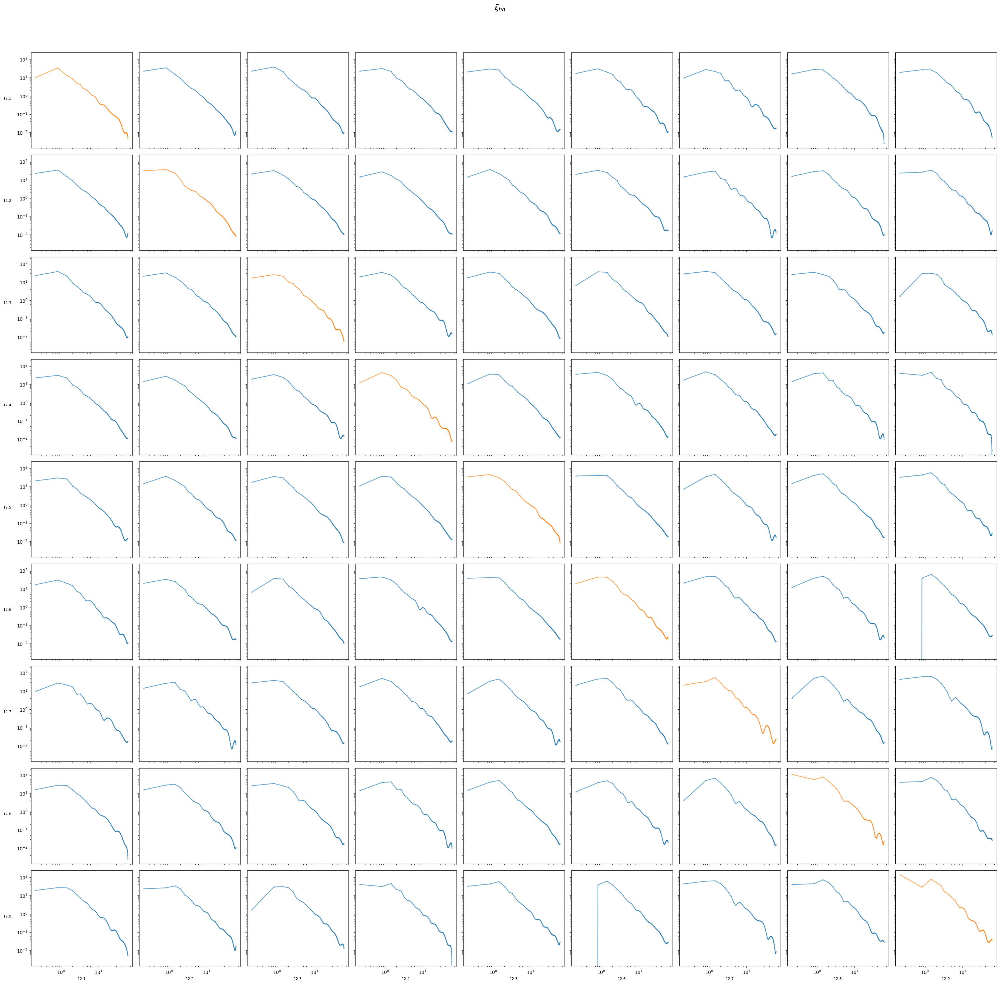

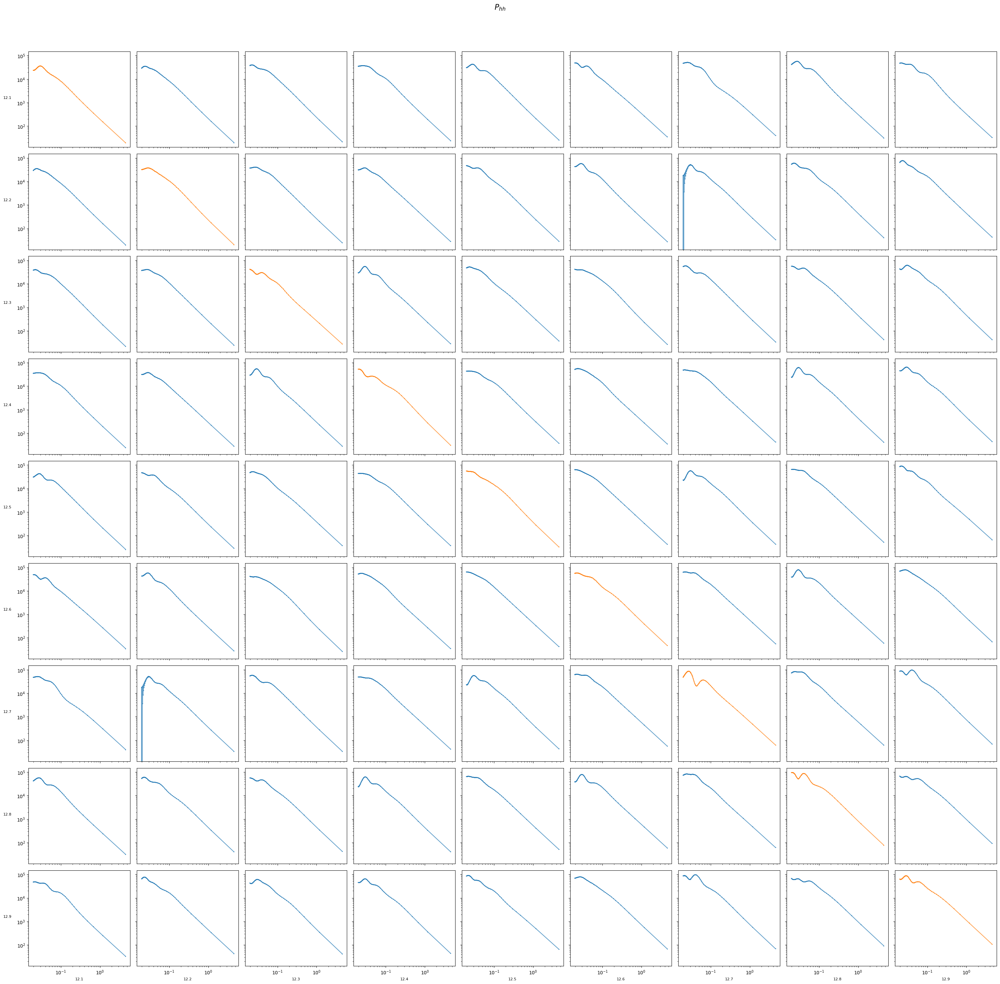

In [2]:
# Filter logMh to only include every 10th element and values >= 12
logMh = g.config['logMh']
logMh_filtered = logMh[logMh >= 12]

# Create a matrix of subplots for xi_hh
fig_xi, axes_xi = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_xi.suptitle(r'$\xi_{hh}$', fontsize=16)

# Create a matrix of subplots for p_hh
fig_phh, axes_phh = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_phh.suptitle(r'$P_{hh}$', fontsize=16)

for i, m1 in enumerate(logMh_filtered):  
    for j, m2 in enumerate(logMh_filtered):  
        # Plot xi_hh
        xi_hh = g.xi_hh_m1m2([m1, m2])
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_xi[i, j].plot(g.rbins_fine, xi_hh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_xi[i, j].set_xscale('log')
        axes_xi[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_xi[i, j].set_xlabel(r'$r$ [Mpc/h]')
        if j == 0:
            axes_xi[i, j].set_ylabel(r'$\xi(r)$')

        # Plot p_hh
        k, phh = g.p_hh_m1m2([m1, m2])
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_phh[i, j].plot(k, phh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_phh[i, j].set_xscale('log')
        axes_phh[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_phh[i, j].set_xlabel(r'$k$ [h/Mpc]')
        if j == 0:
            axes_phh[i, j].set_ylabel(r'$P(k)$')

# Add mass labels to the rows and columns
for ax, m in zip(axes_xi[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_xi[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

for ax, m in zip(axes_phh[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_phh[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

# Adjust layout for better spacing
fig_xi.tight_layout(rect=[0, 0, 1, 0.95])
fig_phh.tight_layout(rect=[0, 0, 1, 0.95])

In [19]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 1e-2,
          'smooth_phh_k': 1e-2,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

Execution time for one cosmology : 12.4302 seconds


In [34]:
def pgg_conv_test():
    fig, ax = plt.subplots(1, 3, figsize=(12, 4))
    all_pggs= []
    for i, dlogMh in enumerate([0.02, 0.05, 0.1]):
        g.config['logMh'] = np.arange(11.0, 12.5, dlogMh)
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=f'dlogMh = {dlogMh}')
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
    fig.suptitle(r'$P_{gg}$ convergence test', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(3, 2))
    for i in range(1, len(all_pggs)):
        ratio = all_pggs[i] / all_pggs[0]
        ax_ratio.plot(k, ratio, label=f'dlogMh = {0.1/(2**i):.3f}')
        ax_ratio.set_title(r'$P_{gg}$')
        ax_ratio.set_xscale('log')
        ax_ratio.grid()
        ax_ratio.set_ylabel('ratio')
        ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
        ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
        ax_ratio.set_ylim(0.95, 1.05)

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:397: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spl = UnivariateSpline(k, phh, s= self.config['smooth_phh_k'], k=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:369: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition ab

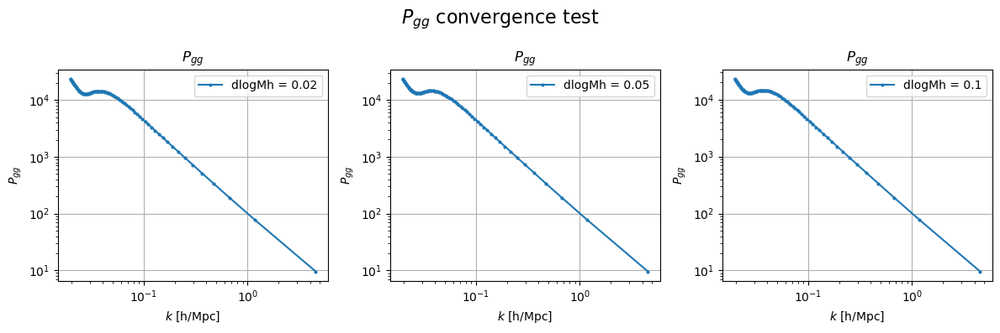

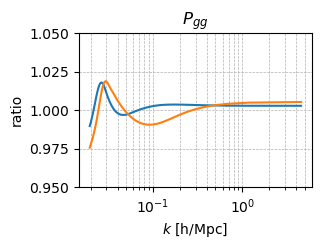

In [35]:
pgg_conv_test()

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:397: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spl = UnivariateSpline(k, phh, s= self.config['smooth_phh_k'], k=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:369: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition ab

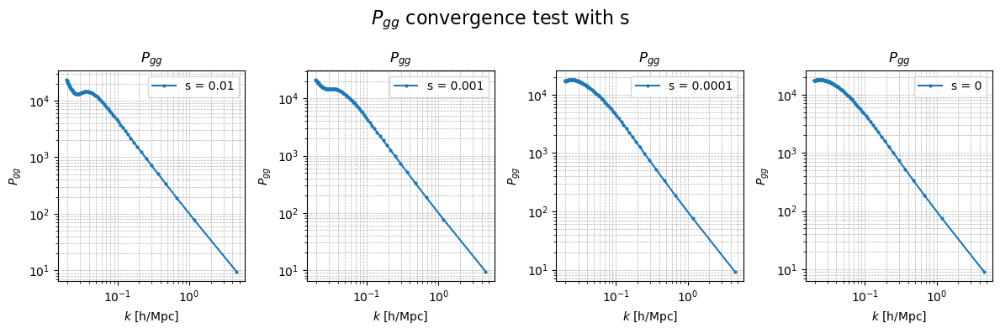

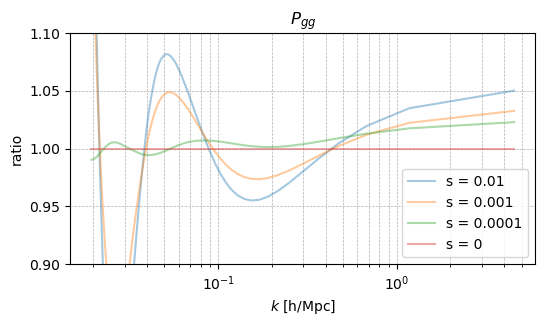

In [20]:
g.config['logMh'] = np.arange(11.0, 12.45, 0.05)
def pgg_conv_test_smoothing_factor():
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_pggs= []
    for i, s in enumerate([1e-2, 1e-3, 1e-4, 0]):
        g.config['smooth_phh_k'] = s
        g.config['smooth_xihh_r'] = s
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=f's = {s}')
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
        ax[i].grid(which='both', linestyle='--', linewidth=0.5)
    fig.suptitle(r'$P_{gg}$ convergence test with s', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 3))
    for i, s in enumerate([1e-2, 1e-3, 1e-4, 0]):
        ratio = all_pggs[i] / all_pggs[-1]
        ax_ratio.plot(k, ratio, label=f's = {s}', alpha=0.4)
    ax_ratio.set_title(r'$P_{gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.9, 1.1)
    ax_ratio.legend()
pgg_conv_test_smoothing_factor()

In [11]:
g.config

{'logMh': array([11.  , 11.05, 11.1 , 11.15, 11.2 , 11.25, 11.3 , 11.35, 11.4 ,
        11.45, 11.5 , 11.55, 11.6 , 11.65, 11.7 , 11.75, 11.8 , 11.85,
        11.9 , 11.95, 12.  , 12.05, 12.1 , 12.15, 12.2 , 12.25, 12.3 ,
        12.35, 12.4 ]),
 'smooth_xihh_r': 0.0001,
 'smooth_phh_k': 0.0001,
 'smooth_xihh_mass': 0,
 'r_range': [0.1, 50]}

- We need some level of smooothing on the $r$ or $k$ direction to smooth the fluctuations in $(P)$
- but too much of it ( `s > 3e-4` ) introduces weird features at $k \sim 3\times10^{-2} \ h/Mpc$, this can be fixed when we have the propagator for $r > 50 Mpc/h$

## what $M_{h, upper}$?

In [7]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 3e-4,
          'smooth_phh_k': 3e-4,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

Execution time for one cosmology : 16.1114 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:369: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  spl = UnivariateSpline(self.xi_emu.rbins, xi_exact_mass, s=self.config['smooth_xihh_r'], k=3)
/home/qezlou/HD2/HETDEX/cosmo/pack_dev/private-gal-emu/src/gal_goku/gal_goku/gal.py:397: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does no

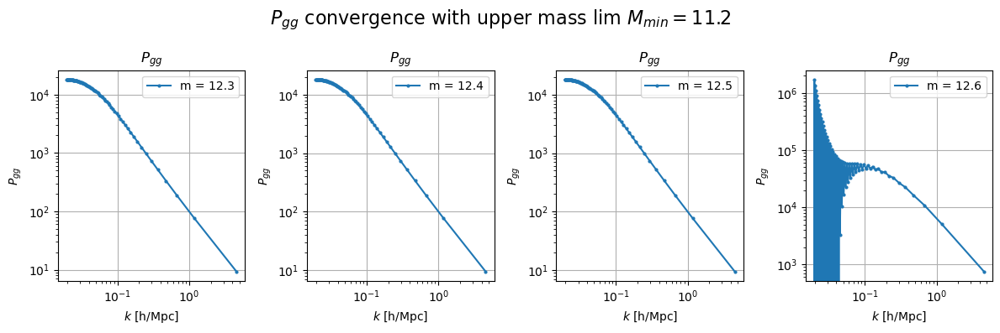

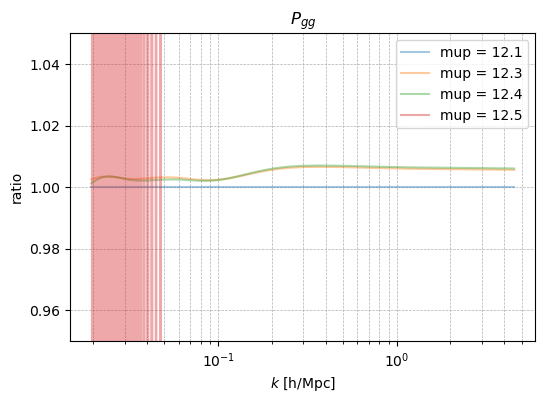

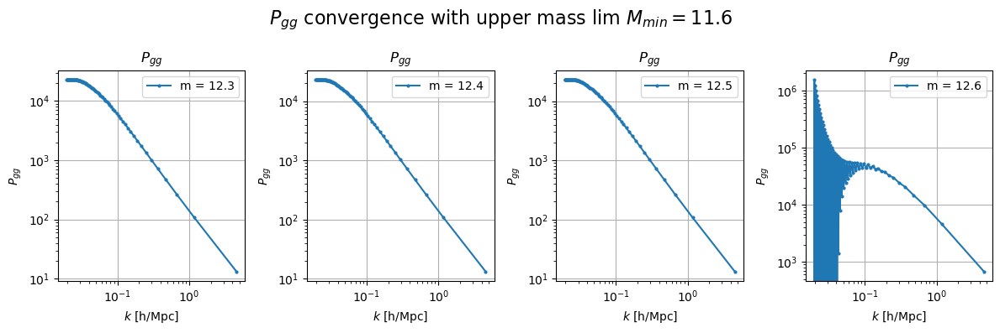

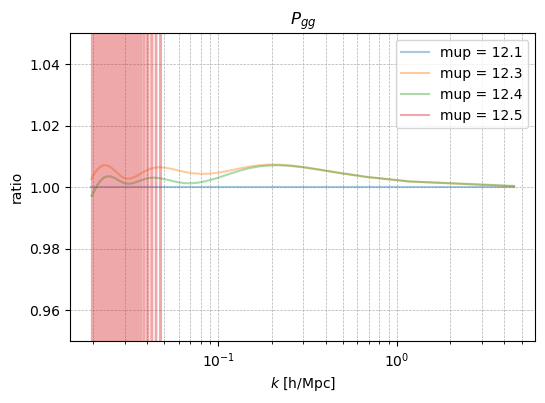

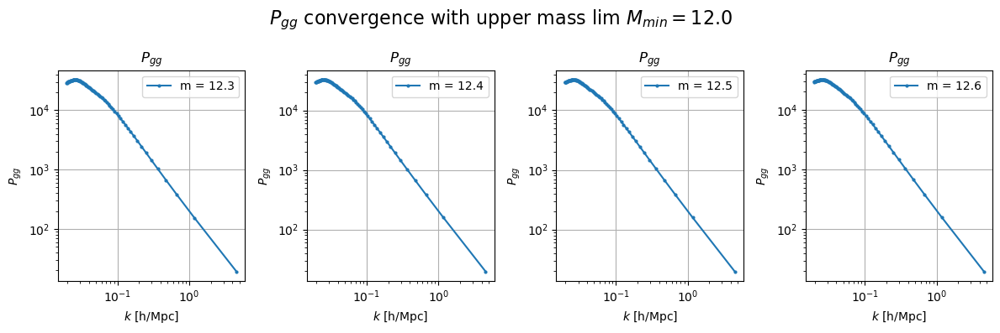

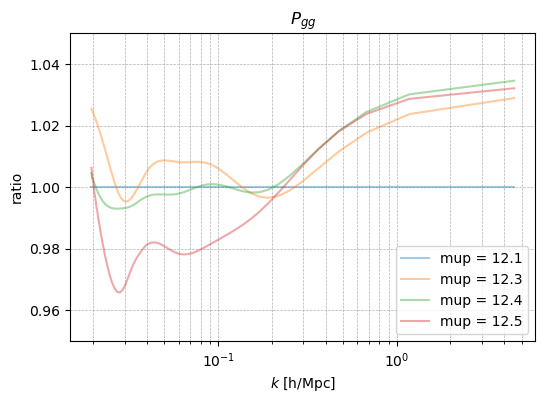

In [ ]:
def pgg_conv_test_upper_mass(hod_Mmin=11.2):
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_pggs= []
    for i, m_up in enumerate([12.3, 12.4, 12.5, 12.6]):
        g.config['logMh'] = np.arange(11.0, m_up, 0.05)
        hod_params = {
            # Central galaxy parameters
            'logMmin': hod_Mmin,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 2.0
            }
        g.reset_hod(hod_params)
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=r'$M_{h, upper}$ ='+str(m_up))
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
    fig.suptitle(r'$P_{gg}$ convergence |  HOD: $M_{min}=$'+f'{hod_Mmin}', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 4))
    for i, m_up in enumerate([12.1, 12.3, 12.4, 12.5]):
        ratio = all_pggs[i] / all_pggs[0]
        ax_ratio.plot(k, ratio, label=r'M_{h, upper} ='+str(m_up))
    ax_ratio.set_title(r'$P_{gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.9, 1.1)
    ax_ratio.legend()
    ax_ratio.legend()
    ax_ratio.set_ylim(0.95, 1.05)
pgg_conv_test_upper_mass(hod_Mmin=11.2)
pgg_conv_test_upper_mass(hod_Mmin=11.6)
pgg_conv_test_upper_mass(hod_Mmin=12.0)

So, as long as $M_{cen, \ min} < 12.0 $, we can stop at $M_{upper} \sim 12.4$ and still have $< 3\%$ error in $P_{gg}$

The plot below shows, for $M_{upper} > 12.45$, we need some level of smoothing ($s = 10^{-4}$)

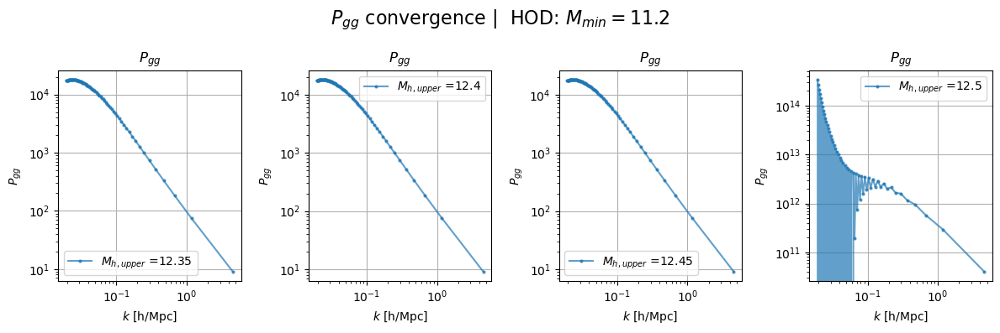

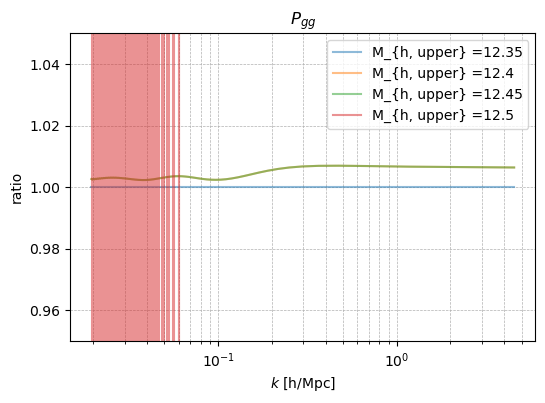

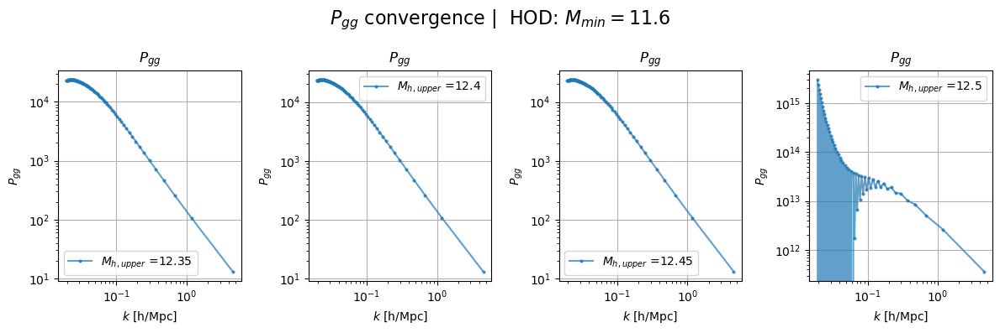

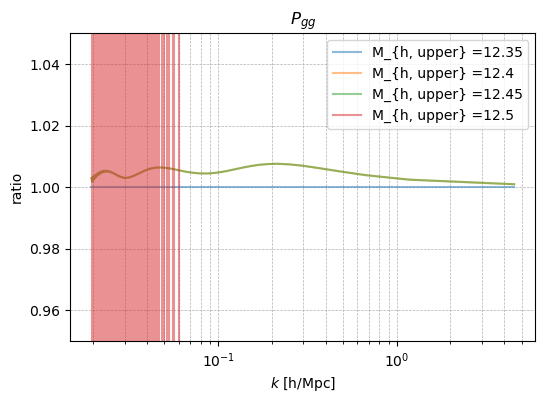

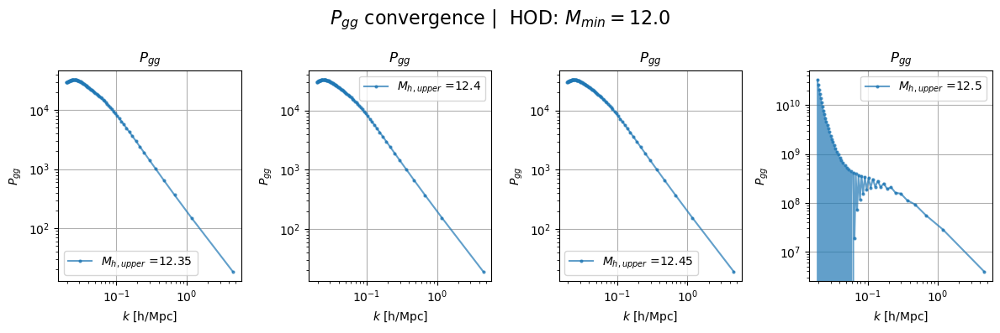

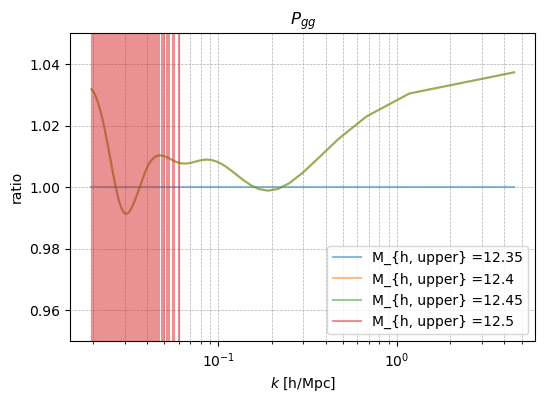

In [10]:
config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g.config = config
def pgg_conv_test_upper_mass(hod_Mmin=11.2):
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_pggs= []
    for i, m_up in enumerate([12.35, 12.4, 12.45, 12.5]):
        g.config['logMh'] = np.arange(11.0, m_up, 0.05)
        hod_params = {
            # Central galaxy parameters
            'logMmin': hod_Mmin,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 2.0
            }
        g.reset_hod(hod_params)
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=r'$M_{h, upper}$ ='+str(m_up), alpha=0.7)
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
    fig.suptitle(r'$P_{gg}$ convergence |  HOD: $M_{min}=$'+f'{hod_Mmin}', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 4))
    for i, m_up in enumerate([12.35, 12.4, 12.45, 12.5]):
        ratio = all_pggs[i] / all_pggs[0]
        ax_ratio.plot(k, ratio, label=r'M_{h, upper} ='+str(m_up), alpha=0.5)
    ax_ratio.set_title(r'$P_{gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.9, 1.1)
    ax_ratio.legend()
    ax_ratio.legend()
    ax_ratio.set_ylim(0.95, 1.05)
pgg_conv_test_upper_mass(hod_Mmin=11.2)
pgg_conv_test_upper_mass(hod_Mmin=11.6)
pgg_conv_test_upper_mass(hod_Mmin=12.0)

Use $dlogM = 0.1$:

In [12]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.1),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

Execution time for one cosmology : 13.0803 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


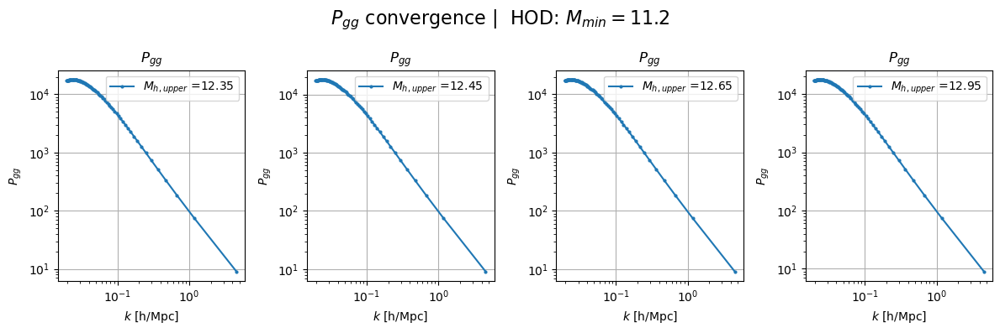

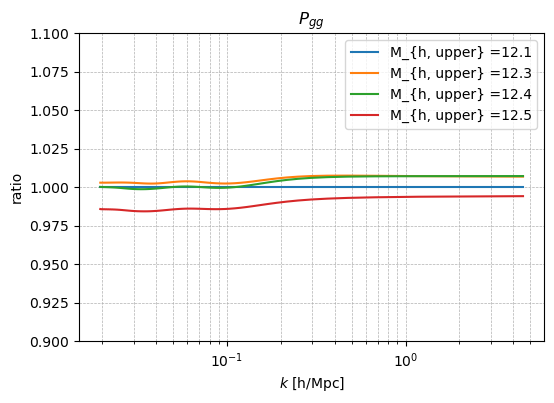

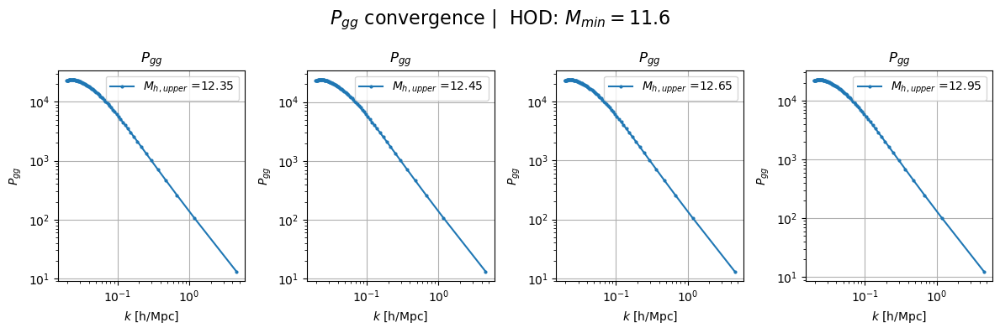

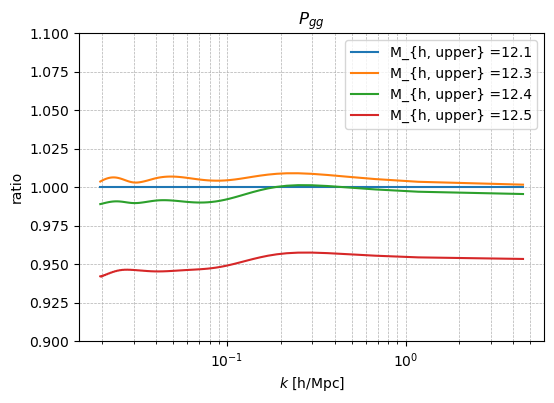

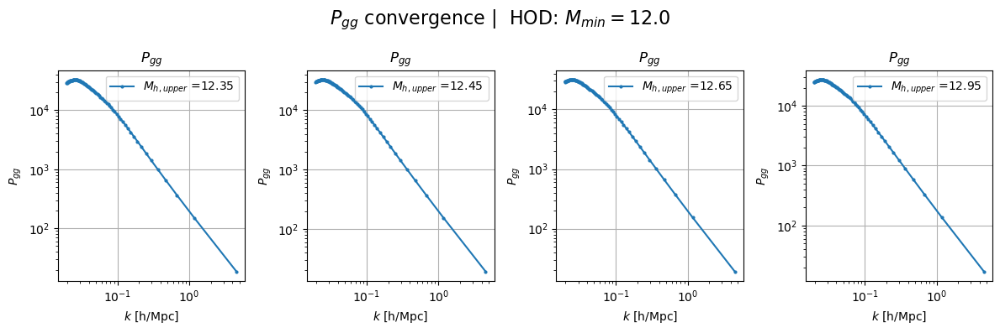

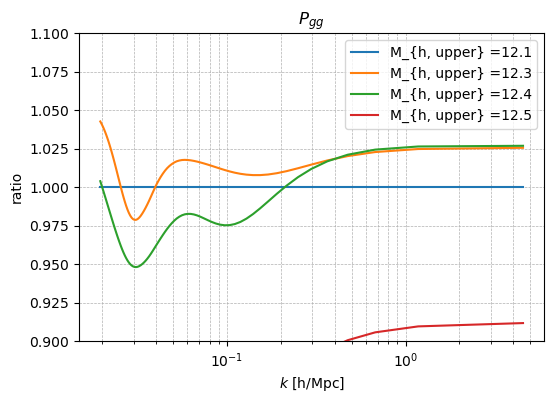

In [13]:
def pgg_conv_test_upper_mass(hod_Mmin=11.2):
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_pggs= []
    for i, m_up in enumerate([12.35, 12.45, 12.65, 12.95]):
        g.config['logMh'] = np.arange(11.0, m_up, 0.1)
        hod_params = {
            # Central galaxy parameters
            'logMmin': hod_Mmin,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 2.0
            }
        g.reset_hod(hod_params)
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=r'$M_{h, upper}$ ='+str(m_up))
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
    fig.suptitle(r'$P_{gg}$ convergence |  HOD: $M_{min}=$'+f'{hod_Mmin}', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 4))
    for i, m_up in enumerate([12.1, 12.3, 12.4, 12.5]):
        ratio = all_pggs[i] / all_pggs[0]
        ax_ratio.plot(k, ratio, label=r'M_{h, upper} ='+str(m_up))
    ax_ratio.set_title(r'$P_{gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.9, 1.1)
    ax_ratio.legend()
    ax_ratio.legend()
    ax_ratio.set_ylim(0.9, 1.1)
pgg_conv_test_upper_mass(hod_Mmin=11.2)
pgg_conv_test_upper_mass(hod_Mmin=11.6)
pgg_conv_test_upper_mass(hod_Mmin=12.0)

So, the $\textit{instablity in the P(k)}$ at high masses originates from the interpoaltion of $\xi_{hh}(r, M_1, M_2)$ in the $M_1$-$M_2$ plane.

Maybe I should train the emulators on a finer mass grid

Also check what Julian suggested: Frist take the FFTLog and then take the finite difference derivative.

Also have non-zeros smoothing on the mass plabe for $\xi_{hh}$

### Reverse order of deriv and FFTLog:

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-04 23:30:12.010408: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-04 23:30:12.013582: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-04 23:30:12.022929: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746419412.037952   43451 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746419412.042544   43451 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746419412.055262   43451 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

gal.XiGal | 05/04/2025 11:30:16 PM | DEBUG  |  Emulators mass bins: [11.  11.1 11.2 11.3 11.4 11.5 11.6 11.7 11.8 11.9 12.  12.1 12.2 12.3
 12.4 12.5 12.6 12.7 12.8 12.9 13. ]
gal.XiGal | 05/04/2025 11:30:16 PM | DEBUG  |  Emulators rbins.size: 26
gal.XiGal | 05/04/2025 11:30:30 PM | DEBUG  |  Convertigg the emulated xi_hh(mth1, mth2) to P_hh(mth1, mth2)
Execution time for one cosmology : 15.7862 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


Plots for thedsholded stats:

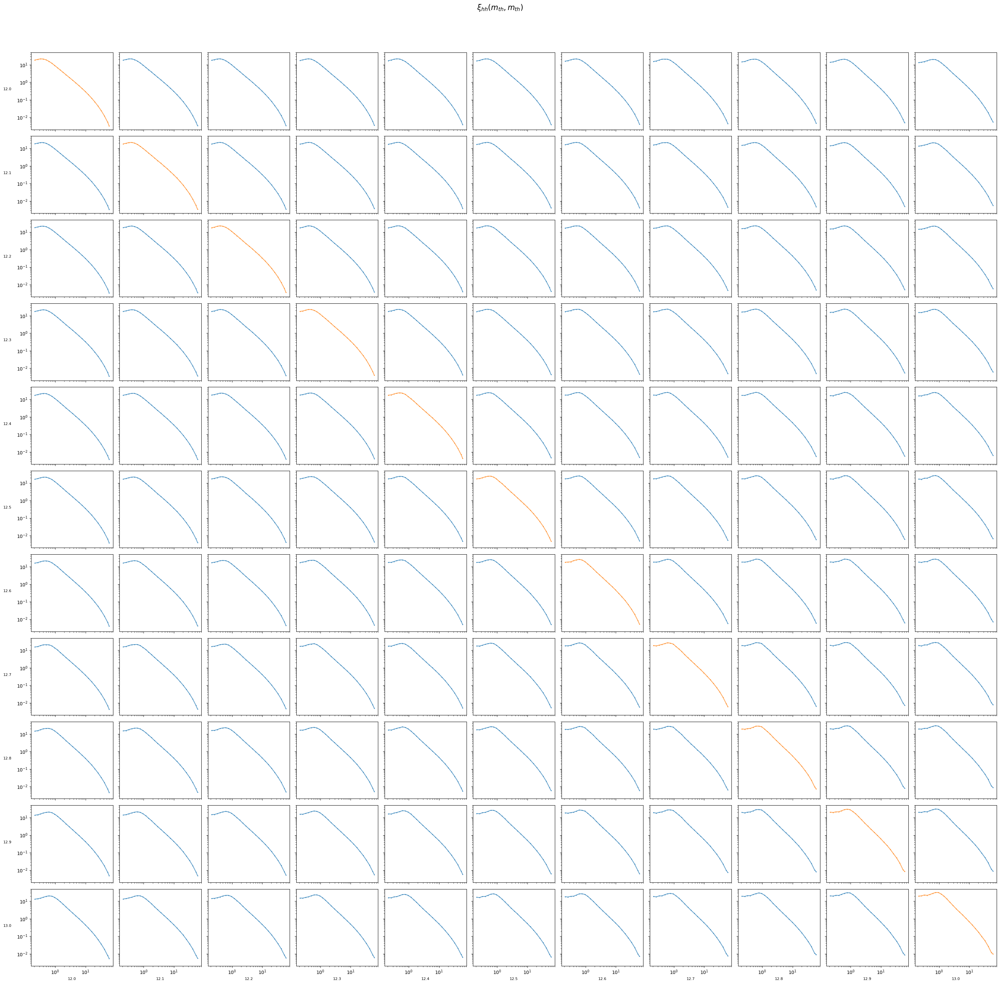

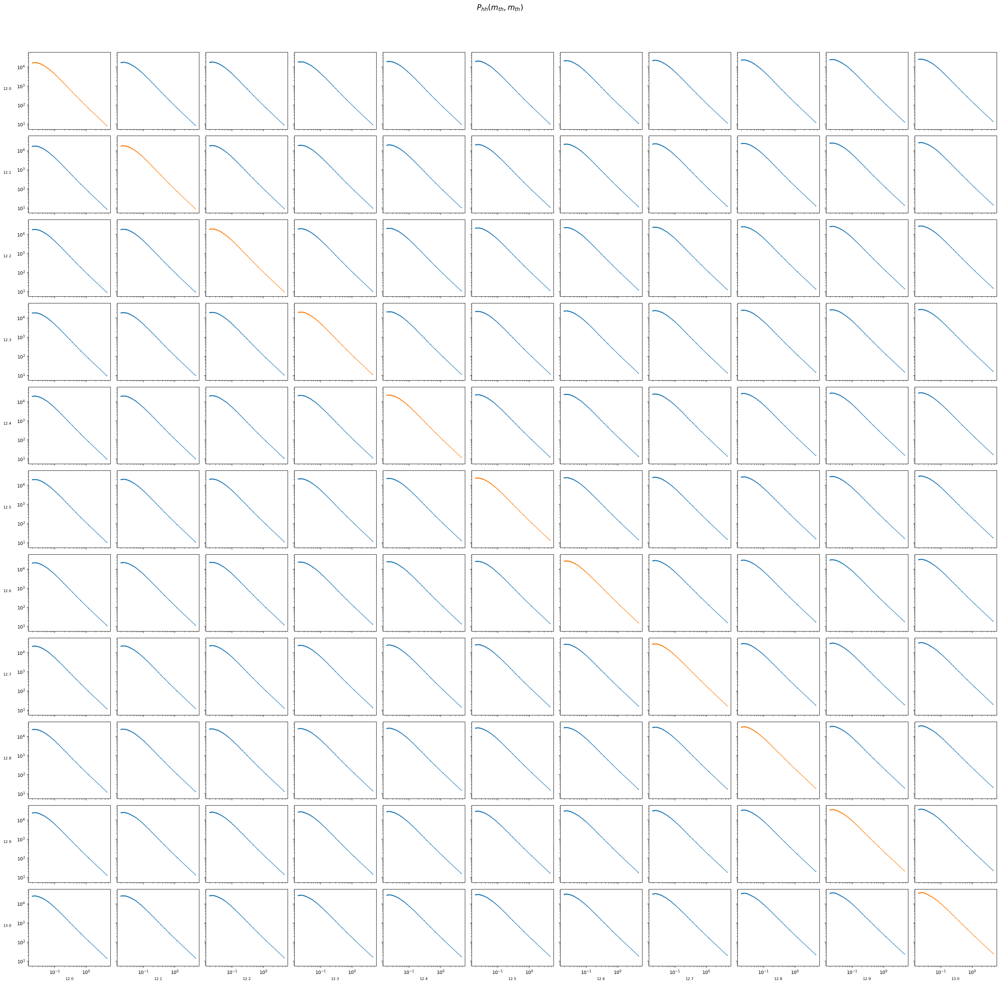

In [ ]:
# Filter logMh to only include every 10th element and values >= 12
logMh = g.xi_emu.mass_bins
logMh_filtered = logMh[logMh >= 12]

# Create a matrix of subplots for xi_hh
fig_xi, axes_xi = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_xi.suptitle(r'$\xi_{hh}(m_{th}, m_{th})$', fontsize=16)

# Create a matrix of subplots for p_hh
fig_phh, axes_phh = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_phh.suptitle(r'$P_{hh}(m_{th}, m_{th})$', fontsize=16)

ind = (g.rbins_fine >= g.config['r_range'][0]) & (g.rbins_fine <= g.config['r_range'][1])
for i, m1 in enumerate(logMh_filtered):  
    for j, m2 in enumerate(logMh_filtered):  
        # Plot xi_hh
        xi_hh = g.xi_grid[i,j]
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_xi[i, j].plot(g.rbins, xi_hh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_xi[i, j].set_xscale('log')
        axes_xi[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_xi[i, j].set_xlabel(r'$r$ [Mpc/h]')
        if j == 0:
            axes_xi[i, j].set_ylabel(r'$\xi(r)$')

        # Plot p_hh
        phh = g.p_grid[i,j]
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_phh[i, j].plot(g.k, phh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_phh[i, j].set_xscale('log')
        axes_phh[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_phh[i, j].set_xlabel(r'$k$ [h/Mpc]')
        if j == 0:
            axes_phh[i, j].set_ylabel(r'$P(k)$')

# Add mass labels to the rows and columns
for ax, m in zip(axes_xi[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_xi[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

for ax, m in zip(axes_phh[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.1f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_phh[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.1f}', fontsize=8)

# Adjust layout for better spacing
fig_xi.tight_layout(rect=[0, 0, 1, 0.95])
fig_phh.tight_layout(rect=[0, 0, 1, 0.95])

Plot the exat mass power:

In [2]:
k, phh_m1m2_matrix = g.get_phh_m1m2_matrix_reversed()

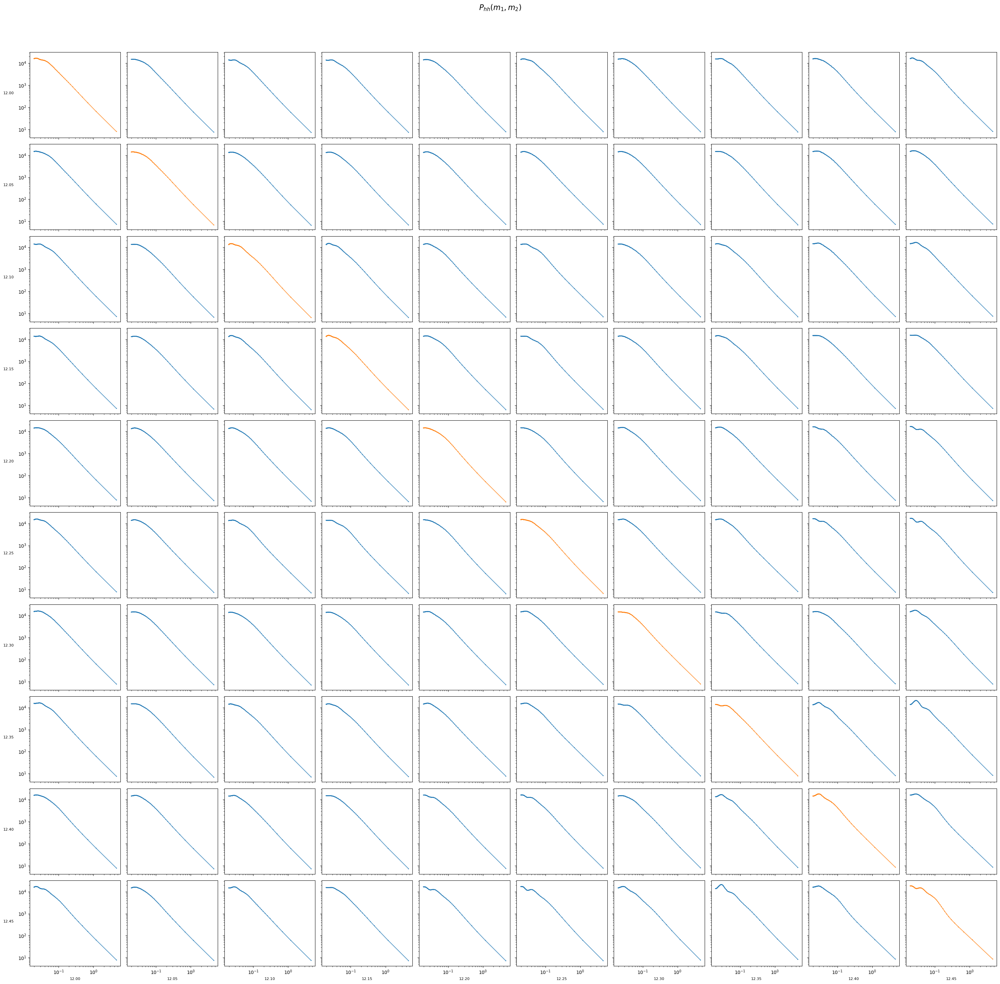

In [7]:
# Filter logMh to only include every 10th element and values >= 12
logMh = g.config['logMh']
logMh_filtered = logMh[logMh >= 12]

# Create a matrix of subplots for p_hh
fig_phh, axes_phh = plt.subplots(len(logMh_filtered), len(logMh_filtered), figsize=(30, 30), sharex=True, sharey=True)
fig_phh.suptitle(r'$P_{hh}(m_1, m_2)$', fontsize=16)

ind = (g.rbins_fine >= g.config['r_range'][0]) & (g.rbins_fine <= g.config['r_range'][1])
for i, m1 in enumerate(logMh_filtered):  
    for j, m2 in enumerate(logMh_filtered):  

        # Plot p_hh
        phh = phh_m1m2_matrix[i,j]
        color = 'C1' if i == j else None  # Use C1 color for diagonal
        axes_phh[i, j].plot(g.k, phh, alpha=0.7, marker='o', markersize=1, color=color)
        axes_phh[i, j].set_xscale('log')
        axes_phh[i, j].set_yscale('log')
        if i == len(logMh_filtered) - 1:
            axes_phh[i, j].set_xlabel(r'$k$ [h/Mpc]')
        if j == 0:
            axes_phh[i, j].set_ylabel(r'$P(k)$')


for ax, m in zip(axes_phh[:, 0], logMh_filtered):
    ax.set_ylabel(f'{m:.2f}', rotation=0, labelpad=20, fontsize=8)
for ax, m in zip(axes_phh[-1, :], logMh_filtered):
    ax.set_xlabel(f'{m:.2f}', fontsize=8)


fig_phh.tight_layout(rect=[0, 0, 1, 0.95])

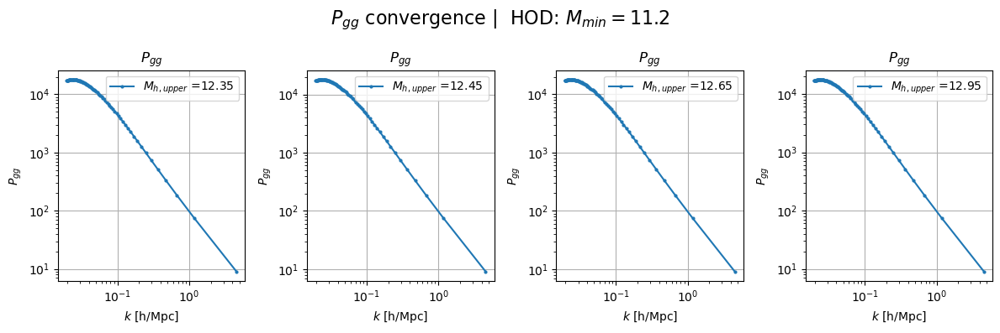

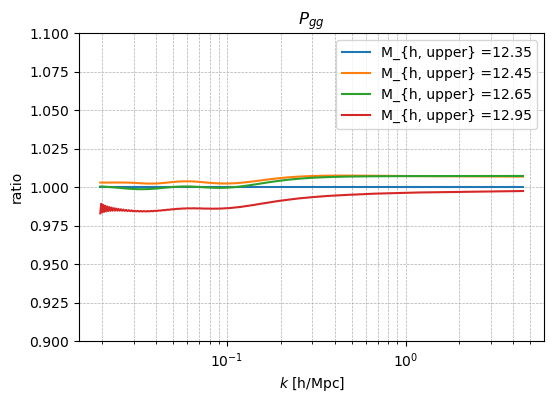

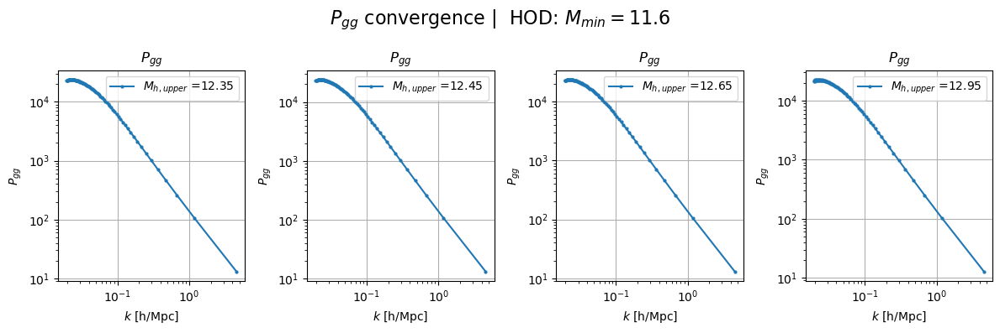

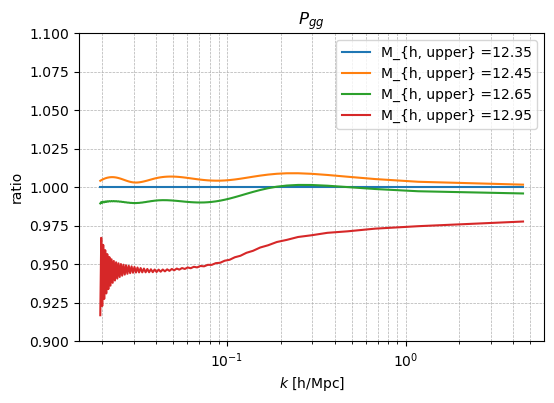

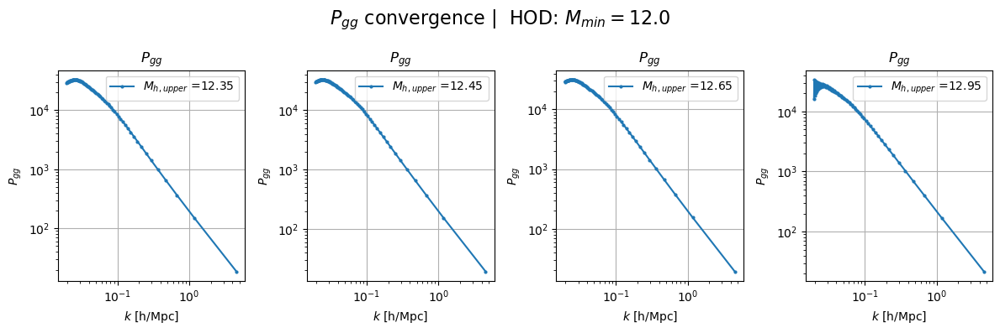

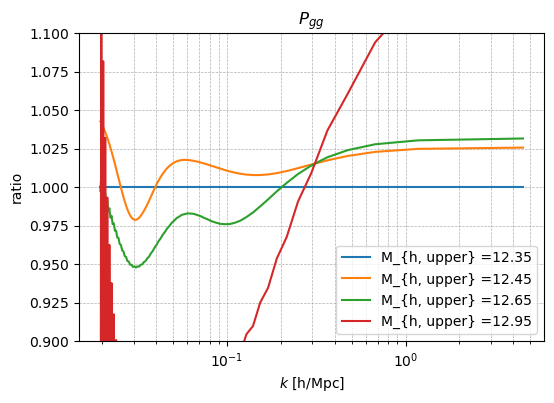

In [3]:
def pgg_conv_test_upper_mass(hod_Mmin=11.2):
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_pggs= []
    for i, m_up in enumerate([12.35, 12.45, 12.65, 12.95]):
        g.config['logMh'] = np.arange(11.0, m_up, 0.1)
        hod_params = {
            # Central galaxy parameters
            'logMmin': hod_Mmin,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 2.0
            }
        g.reset_hod(hod_params)
        k, pgg_cc = g._pgg_2h_cc()
        all_pggs.append(pgg_cc)
        ax[i].plot(k, pgg_cc, marker='o', markersize=2, label=r'$M_{h, upper}$ ='+str(m_up))
        ax[i].set_title(r'$P_{gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$P_{gg}$')
        ax[i].set_xlabel(r'$k$ [h/Mpc]')
        ax[i].legend()
    fig.suptitle(r'$P_{gg}$ convergence |  HOD: $M_{min}=$'+f'{hod_Mmin}', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 4))
    for i, m_up in enumerate([12.35, 12.45, 12.65, 12.95]):
        ratio = all_pggs[i] / all_pggs[0]
        ax_ratio.plot(k, ratio, label=r'M_{h, upper} ='+str(m_up))
    ax_ratio.set_title(r'$P_{gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$k$ [h/Mpc]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.9, 1.1)
    ax_ratio.legend()
    ax_ratio.legend()
    ax_ratio.set_ylim(0.9, 1.1)
pgg_conv_test_upper_mass(hod_Mmin=11.2)
pgg_conv_test_upper_mass(hod_Mmin=11.6)
pgg_conv_test_upper_mass(hod_Mmin=12.0)

### Individual terms in $P_{2h}$:

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='DEBUG', config=config)
cosmo_test = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
g.reset_hod()
g.reset_cosmo(cosmo_test)
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-05 14:22:40.890150: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-05 14:22:40.893362: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-05 14:22:40.902978: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746472960.918218   81590 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746472960.922801   81590 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746472960.935914   81590 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

gal.XiGal | 05/05/2025 02:22:44 PM | DEBUG  |  Emulators mass bins: [11.  11.1 11.2 11.3 11.4 11.5 11.6 11.7 11.8 11.9 12.  12.1 12.2 12.3
 12.4 12.5 12.6 12.7 12.8 12.9 13. ]
gal.XiGal | 05/05/2025 02:22:44 PM | DEBUG  |  Emulators rbins.size: 26
gal.XiGal | 05/05/2025 02:22:59 PM | DEBUG  |  Convertigg the emulated xi_hh(mth1, mth2) to P_hh(mth1, mth2)
Execution time for one cosmology : 15.6364 seconds


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


In [3]:
k, pgg_2h_cc = g._pgg_2h_cc()
_, pgg_2h_cs = g._pgg_2h_cs()
_, pgg_2h_ss = g._pgg_2h_ss()
k, p_1h = g._pgg_1h()

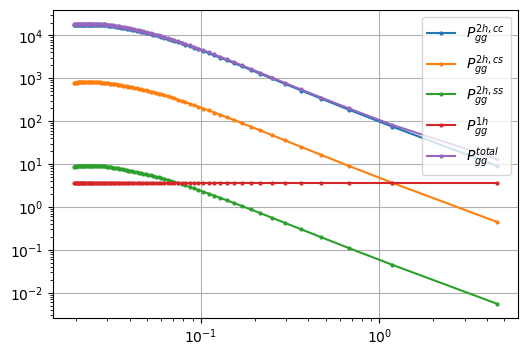

In [4]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.plot(k, pgg_2h_cc, marker='o', markersize=2, label=r'$P_{gg}^{2h,cc}$')
ax.plot(k, pgg_2h_cs, marker='o', markersize=2, label=r'$P_{gg}^{2h,cs}$')
ax.plot(k, pgg_2h_ss, marker='o', markersize=2, label=r'$P_{gg}^{2h,ss}$')
ax.plot(k, p_1h, marker='o', markersize=2, label=r'$P_{gg}^{1h}$')
ax.plot(k, pgg_2h_cc + pgg_2h_cs + pgg_2h_ss + p_1h, marker='o', markersize=2, label=r'$P_{gg}^{total}$')
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
ax.legend()

In [18]:
r, xigg_2h_cc = g._xigg_2h_cc()
r, xigg_2h_cs = g._xigg_2h_cs()
r, xigg_2h_ss = g._xigg_2h_ss()
r, xigg_1h = g._xigg_1h()

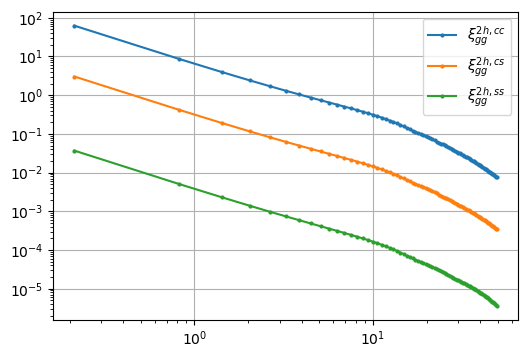

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.plot(r, xigg_2h_cc, marker='o', markersize=2, label=r'$\xi_{gg}^{2h,cc}$')
ax.plot(r, xigg_2h_cs, marker='o', markersize=2, label=r'$\xi_{gg}^{2h,cs}$')
ax.plot(r, xigg_2h_ss, marker='o', markersize=2, label=r'$\xi_{gg}^{2h,ss}$')
#ax.plot(r, xigg_1h, marker='o', markersize=2, label=r'$\xi_{gg}^{1h}$')
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
ax.legend()

In [7]:
r, xigg = g.get_xi_gg()

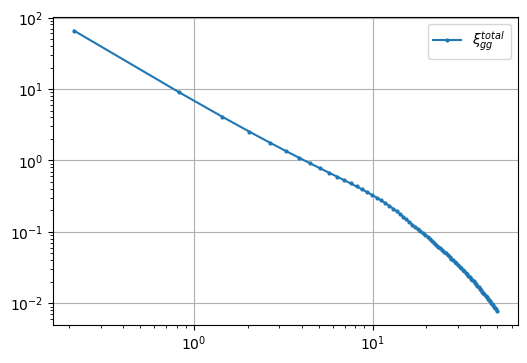

In [8]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.plot(r, xigg, marker='o', markersize=2, label=r'$\xi_{gg}^{total}$')
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
ax.legend()

In [23]:
r, wp = g.get_wp_gg()

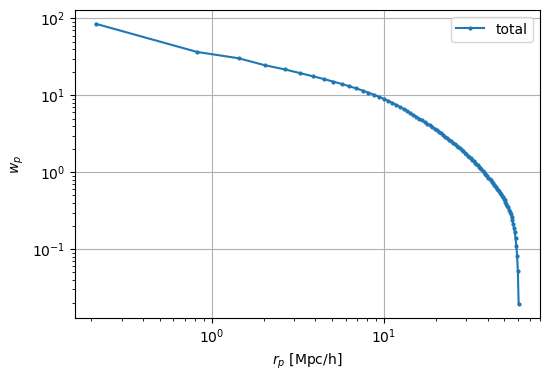

In [26]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ax.plot(r, wp, marker='o', markersize=2, label='total')
ax.set_ylabel(r'$w_{p}$')
ax.set_xlabel(r'$r_p$ [Mpc/h]')
ax.set_xscale('log')
ax.set_yscale('log')
ax.grid()
ax.legend()

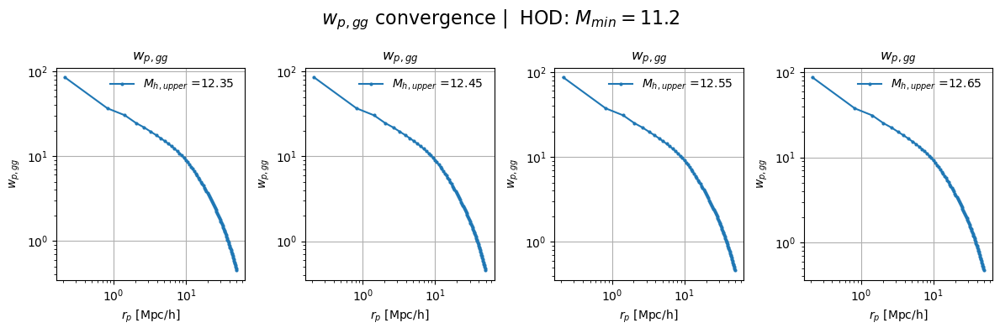

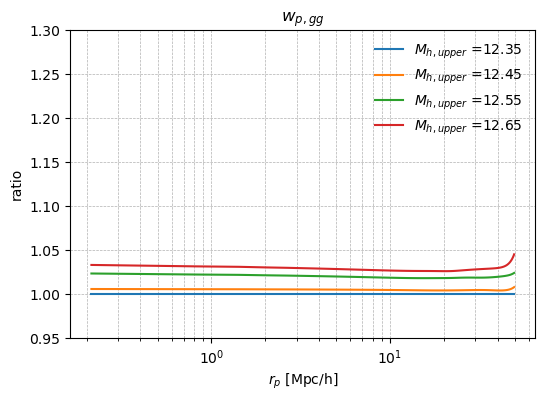

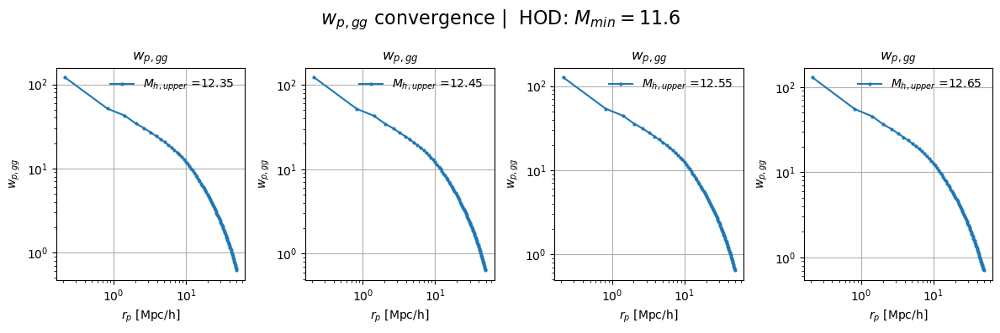

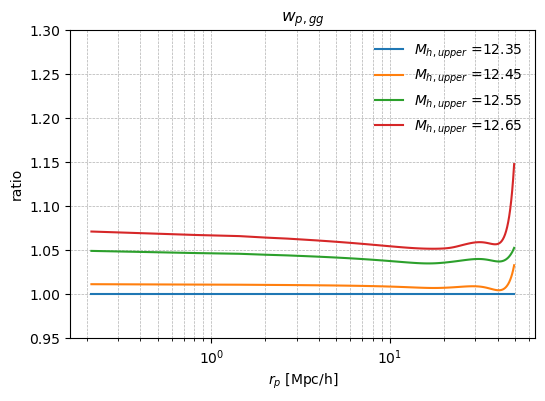

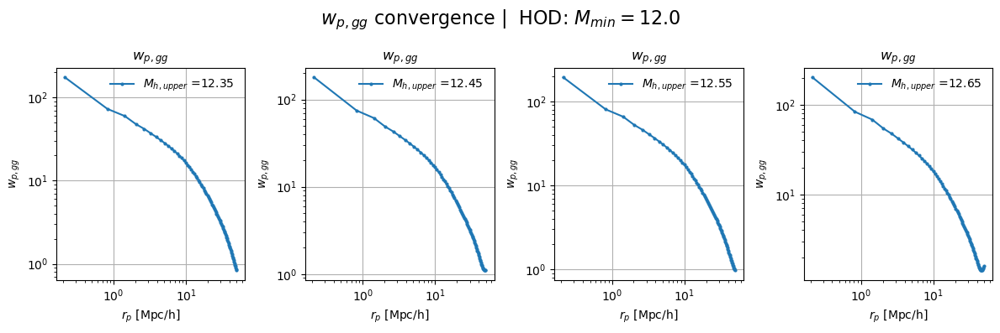

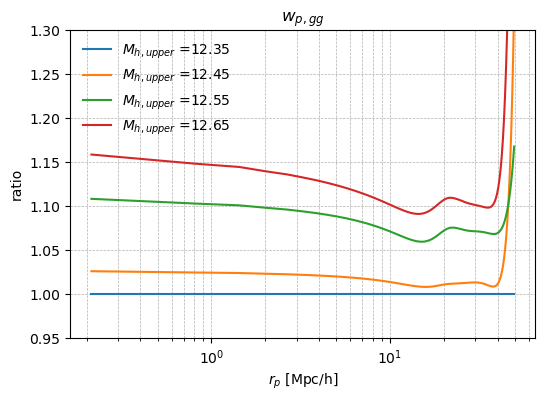

In [4]:
def wp_gg_conv_test_upper_mass(hod_Mmin=11.2):
    fig, ax = plt.subplots(1, 4, figsize=(12, 4))
    all_wp_ggs = []
    for i, m_up in enumerate([12.35, 12.45, 12.55, 12.65]):
        g.config['logMh'] = np.arange(11.0, m_up+0.05, 0.05)
        hod_params = {
            # Central galaxy parameters
            'logMmin': hod_Mmin,
            'sig_logM': 0.1,
            #'alpha_inc': 0.5,
            #'Minc': 12.0,
            # Satellite galaxy parameters
            'M1': 12.5,
            'kappa': 1.1,
            'alpha': 2.0
            }
        g.reset_hod(hod_params)
        r, wp_gg = g.get_wp_gg()
        all_wp_ggs.append(wp_gg)
        ax[i].plot(r, wp_gg, marker='o', markersize=2, label=r'$M_{h, upper}$ ='+str(m_up))
        ax[i].set_title(r'$w_{p, gg}$')
        ax[i].set_xscale('log')
        ax[i].set_yscale('log')
        ax[i].grid()
        ax[i].set_ylabel(r'$w_{p, gg}$')
        ax[i].set_xlabel(r'$r_p$ [Mpc/h]')
        ax[i].legend(framealpha=0)
    fig.suptitle(r'$w_{p, gg}$ convergence |  HOD: $M_{min}=$'+f'{hod_Mmin}', fontsize=16)
    fig.tight_layout()
    # plot the ratio
    fig_ratio, ax_ratio = plt.subplots(1, 1, figsize=(6, 4))
    for i, m_up in enumerate([12.35, 12.45, 12.55, 12.65]):
        ratio = all_wp_ggs[i] / all_wp_ggs[0]
        ax_ratio.plot(r, ratio, label=r'$M_{h, upper}$ ='+str(m_up))
    ax_ratio.set_title(r'$w_{p, gg}$')
    ax_ratio.set_xscale('log')
    ax_ratio.grid()
    ax_ratio.set_ylabel('ratio')
    ax_ratio.set_xlabel(r'$r_p$ [Mpc/h]')
    ax_ratio.grid(which='both', linestyle='--', linewidth=0.5)
    ax_ratio.set_ylim(0.95, 1.3)
    ax_ratio.legend(framealpha=0)
    ax_ratio.set_ylim(0.95, 1.3)

wp_gg_conv_test_upper_mass(hod_Mmin=11.2)
wp_gg_conv_test_upper_mass(hod_Mmin=11.6)
wp_gg_conv_test_upper_mass(hod_Mmin=12.0)

## Response to cosmology:

In [1]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

start_time = time.time()

config = {'logMh': np.arange(11.0, 12.5, 0.05),
          'smooth_xihh_r': 0,
          'smooth_phh_k': 0,
          'smooth_xihh_mass': 0,
          'r_range': [0.1, 50]}
g = gal.Gal(logging_level='INFO', config=config)
g.reset_hod()
end_time = time.time()
print(f"Execution time for one cosmology : {end_time - start_time:.4f} seconds")

2025-05-09 23:33:16.237099: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-09 23:33:16.239835: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-09 23:33:16.248797: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1746851596.263851  605227 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1746851596.268397  605227 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1746851596.280437  605227 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

XiEmulator | 05/09/2025 11:33:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl


2025-05-09 23:33:18.871754: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Execution time for one cosmology : 1.6329 seconds


In [2]:
cosmo_mid = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
cosmo_lower = np.copy(cosmo_mid)
cosmo_lower[3] = cosmo_mid[3] - np.abs(g.xi_emu.cosmo_max[3] - g.xi_emu.cosmo_min[3])/4
cosmo_upper = np.copy(cosmo_mid)
cosmo_upper[3] = cosmo_mid[3] + np.abs(g.xi_emu.cosmo_max[3] - g.xi_emu.cosmo_min[3])/4


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


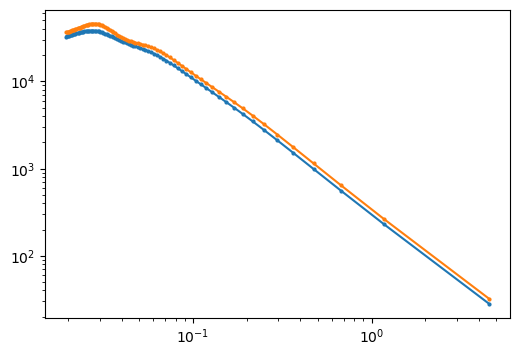

In [3]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
g.reset_cosmo(cosmo_upper)
phh = g.get_p_hh_mth(12.2, 12.2)
ax.plot(g.k, phh, marker='o', markersize=2, label=r'$P_{hh}$')
phh = g.get_p_hh_mth(12.3, 12.3)
ax.plot(g.k, phh, marker='o', markersize=2, label=r'$P_{hh}$')
ax.set_xscale('log')
ax.set_yscale('log')

In [6]:
np.arange(12.3, 11, -0.1)

array([12.3, 12.2, 12.1, 12. , 11.9, 11.8, 11.7, 11.6, 11.5, 11.4, 11.3,
       11.2, 11.1, 11. ])

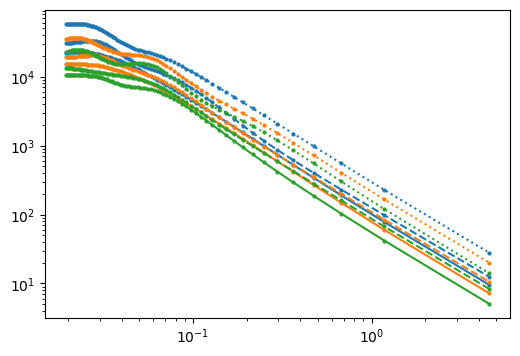

In [6]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
ls = ['-', '--', ':']
for i, c in enumerate([cosmo_lower, cosmo_mid, cosmo_upper]):
    g.reset_cosmo(c)
    for j, m in enumerate([11.2, 11.5, 12.0]):
        p_hh_m1m2_upper = g.get_phh_m1m2_reversed((m, m))
        ax.plot(g.k, p_hh_m1m2_upper, marker='o', markersize=2, color=f'C{i}', ls=ls[j])
    ax.set_yscale('log')
    ax.set_xscale('log')


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


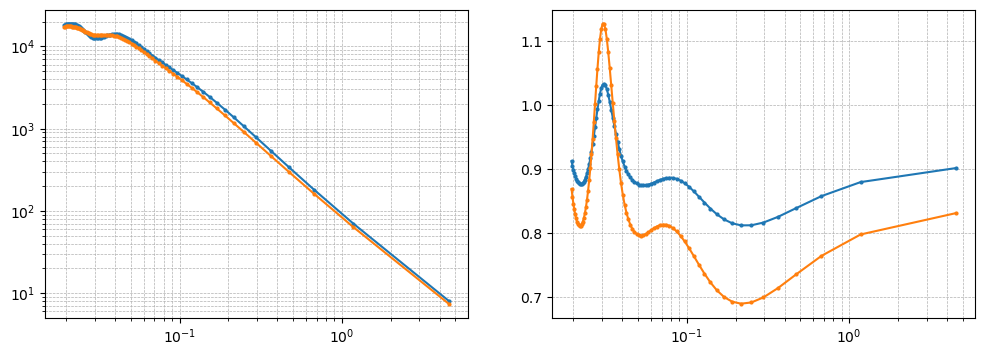

In [3]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ls = ['-', '--', ':']
p_hh = []
m = 11.5
for i, c in enumerate([cosmo_lower, cosmo_mid, cosmo_upper]):
    g.reset_cosmo(c)
    p_hh.append(g.get_phh_m1m2_reversed((m, m)))

for i in range(1, len(p_hh)):
    ax[0].plot(g.k, p_hh[i], marker='o', markersize=2, label=f'cosmo_{["lower", "mid", "upper"][i]}')
    ratio = p_hh[i] / p_hh[0]
    ax[1].plot(g.k, ratio, marker='o', markersize=2, label=f'cosmo_{["lower", "mid", "upper"][i]}')


ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].set_xscale('log')
ax[0].grid(which='both', linestyle='--', linewidth=0.5)
ax[1].grid(which='both', linestyle='--', linewidth=0.5)


In [3]:

xi_ggs = []
all_cosmos = [cosmo_lower, cosmo_mid, cosmo_upper]
for i, c in enumerate(all_cosmos):
    g.reset_cosmo(c)
    r, xigg = g.get_xi_gg()
    xi_ggs.append(xigg)


/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


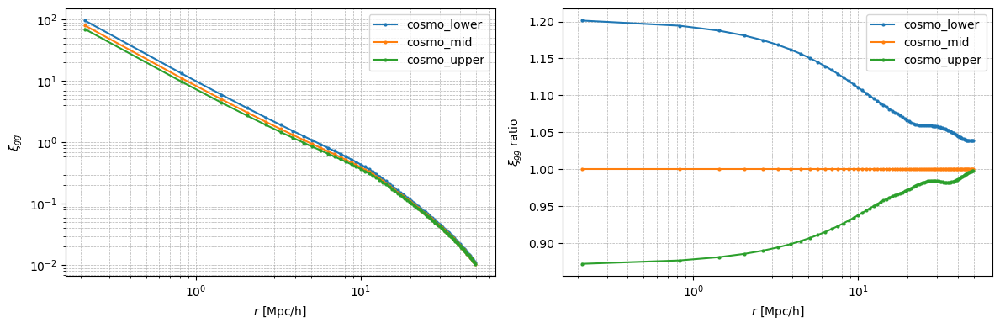

In [5]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
for i in range(len(xi_ggs)):
    ax[0].plot(r, xi_ggs[i], marker='o', markersize=2, label=f'cosmo_{["lower", "mid", "upper"][i]}')
    ax[1].plot(r, xi_ggs[i] / xi_ggs[1], marker='o', markersize=2, label=f'cosmo_{["lower", "mid", "upper"][i]}')

ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].set_xscale('log')
ax[0].grid(which='both', linestyle='--', linewidth=0.5)
ax[1].grid(which='both', linestyle='--', linewidth=0.5)
ax[0].set_ylabel(r'$\xi_{gg}$')
ax[1].set_ylabel(r'$\xi_{gg}$ ratio')
ax[0].set_xlabel(r'$r$ [Mpc/h]')
ax[1].set_xlabel(r'$r$ [Mpc/h]')
ax[0].legend()
ax[1].legend()
fig.tight_layout()



gal.XiGal | 05/07/2025 12:08:16 PM | DEBUG  |  Convertigg the emulated xi_hh(mth1, mth2) to P_hh(mth1, mth2)
gal.XiGal | 05/07/2025 12:08:26 PM | DEBUG  |  Convertigg the emulated xi_hh(mth1, mth2) to P_hh(mth1, mth2)


Text(0.5, 0, '$M$ [h/Mpc]')

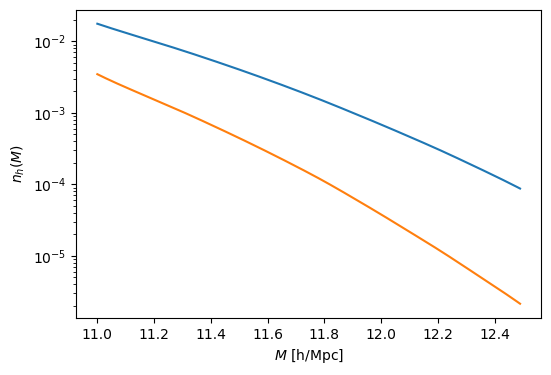

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))
g.reset_cosmo(cosmo_mid)
dens = []
for m in g.config['logMh']:
    dens.append(g.mth_to_dens(m))
#ax.plot(g.hmf, marker='o', markersize=2, label=r'$P_{hh}^{lower}$')
ax.plot(g.config['logMh'], dens, markersize=2, label=r'$P_{hh}^{lower}$')
g.reset_cosmo(cosmo_lower)
dens = []
for m in g.config['logMh']:
    dens.append(g.mth_to_dens(m))
ax.plot(g.config['logMh'], dens, markersize=2, label=r'$P_{hh}^{lower}$')
ax.set_yscale('log')
ax.set_ylabel(r'$n_{h}(M)$')
ax.set_xlabel(r'$M$ [h/Mpc]')

In [7]:
import matplotlib.pyplot as plt
import importlib
import time
import numpy as np
from gal_goku import gal
importlib.reload(gal)

all_xigg_preds =[]
for i in range(36):
    g = gal.Gal(leave=i, logging_level='INFO')
    g.reset_hod()
    cosmo_mid = g.xi_emu.cosmo_min + (g.xi_emu.cosmo_max - g.xi_emu.cosmo_min)/2
    cosmo_lower = np.copy(cosmo_mid)
    g.reset_cosmo(cosmo_lower)
    r, xigg = g.get_xi_gg()
    all_xigg_preds.append(xigg)

XiEmulator | 05/10/2025 06:00:15 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave0.pkl
XiEmulator | 05/10/2025 06:00:15 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave0.pkl
XiEmulator | 05/10/2025 06:00:15 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave0.pkl
XiEmulator | 05/10/2025 06:00:15 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave0.pkl
XiEmulator | 05/10/2025 06:00:15 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave0.pkl
XiEmulator | 05/10/2025 06:00:15 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:00:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave1.pkl
XiEmulator | 05/10/2025 06:00:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave1.pkl
XiEmulator | 05/10/2025 06:00:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave1.pkl
XiEmulator | 05/10/2025 06:00:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave1.pkl
XiEmulator | 05/10/2025 06:00:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave1.pkl
XiEmulator | 05/10/2025 06:00:50 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:01:25 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave2.pkl
XiEmulator | 05/10/2025 06:01:25 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave2.pkl
XiEmulator | 05/10/2025 06:01:25 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave2.pkl
XiEmulator | 05/10/2025 06:01:25 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave2.pkl
XiEmulator | 05/10/2025 06:01:25 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave2.pkl
XiEmulator | 05/10/2025 06:01:25 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:02:00 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave3.pkl
XiEmulator | 05/10/2025 06:02:00 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave3.pkl
XiEmulator | 05/10/2025 06:02:00 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave3.pkl
XiEmulator | 05/10/2025 06:02:00 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave3.pkl
XiEmulator | 05/10/2025 06:02:00 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave3.pkl
XiEmulator | 05/10/2025 06:02:00 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:02:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave4.pkl
XiEmulator | 05/10/2025 06:02:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave4.pkl
XiEmulator | 05/10/2025 06:02:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave4.pkl
XiEmulator | 05/10/2025 06:02:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave4.pkl
XiEmulator | 05/10/2025 06:02:35 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave4.pkl
XiEmulator | 05/10/2025 06:02:35 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:03:10 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave5.pkl
XiEmulator | 05/10/2025 06:03:10 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave5.pkl
XiEmulator | 05/10/2025 06:03:10 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave5.pkl
XiEmulator | 05/10/2025 06:03:10 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave5.pkl
XiEmulator | 05/10/2025 06:03:10 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave5.pkl
XiEmulator | 05/10/2025 06:03:10 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:03:45 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave6.pkl
XiEmulator | 05/10/2025 06:03:45 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave6.pkl
XiEmulator | 05/10/2025 06:03:45 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave6.pkl
XiEmulator | 05/10/2025 06:03:45 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave6.pkl
XiEmulator | 05/10/2025 06:03:45 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave6.pkl
XiEmulator | 05/10/2025 06:03:45 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:04:20 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave7.pkl
XiEmulator | 05/10/2025 06:04:20 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave7.pkl
XiEmulator | 05/10/2025 06:04:20 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave7.pkl
XiEmulator | 05/10/2025 06:04:20 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave7.pkl
XiEmulator | 05/10/2025 06:04:20 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave7.pkl
XiEmulator | 05/10/2025 06:04:20 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:04:55 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave8.pkl
XiEmulator | 05/10/2025 06:04:55 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave8.pkl
XiEmulator | 05/10/2025 06:04:55 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave8.pkl
XiEmulator | 05/10/2025 06:04:55 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave8.pkl
XiEmulator | 05/10/2025 06:04:55 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave8.pkl
XiEmulator | 05/10/2025 06:04:55 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:05:30 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave9.pkl
XiEmulator | 05/10/2025 06:05:30 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave9.pkl
XiEmulator | 05/10/2025 06:05:30 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave9.pkl
XiEmulator | 05/10/2025 06:05:30 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave9.pkl
XiEmulator | 05/10/2025 06:05:30 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave9.pkl
XiEmulator | 05/10/2025 06:05:30 PM | IN

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:06:06 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave10.pkl
XiEmulator | 05/10/2025 06:06:06 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave10.pkl
XiEmulator | 05/10/2025 06:06:06 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave10.pkl
XiEmulator | 05/10/2025 06:06:06 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave10.pkl
XiEmulator | 05/10/2025 06:06:06 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave10.pkl
XiEmulator | 05/10/2025 06:06:06 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:06:41 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave11.pkl
XiEmulator | 05/10/2025 06:06:41 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave11.pkl
XiEmulator | 05/10/2025 06:06:41 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave11.pkl
XiEmulator | 05/10/2025 06:06:41 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave11.pkl
XiEmulator | 05/10/2025 06:06:41 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave11.pkl
XiEmulator | 05/10/2025 06:06:41 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:07:16 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave12.pkl
XiEmulator | 05/10/2025 06:07:16 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave12.pkl
XiEmulator | 05/10/2025 06:07:16 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave12.pkl
XiEmulator | 05/10/2025 06:07:16 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave12.pkl
XiEmulator | 05/10/2025 06:07:16 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave12.pkl
XiEmulator | 05/10/2025 06:07:16 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:07:51 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave13.pkl
XiEmulator | 05/10/2025 06:07:51 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave13.pkl
XiEmulator | 05/10/2025 06:07:51 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave13.pkl
XiEmulator | 05/10/2025 06:07:51 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave13.pkl
XiEmulator | 05/10/2025 06:07:51 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave13.pkl
XiEmulator | 05/10/2025 06:07:51 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:08:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave14.pkl
XiEmulator | 05/10/2025 06:08:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave14.pkl
XiEmulator | 05/10/2025 06:08:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave14.pkl
XiEmulator | 05/10/2025 06:08:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave14.pkl
XiEmulator | 05/10/2025 06:08:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave14.pkl
XiEmulator | 05/10/2025 06:08:26 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:09:01 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave15.pkl
XiEmulator | 05/10/2025 06:09:01 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave15.pkl
XiEmulator | 05/10/2025 06:09:01 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave15.pkl
XiEmulator | 05/10/2025 06:09:01 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave15.pkl
XiEmulator | 05/10/2025 06:09:01 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave15.pkl
XiEmulator | 05/10/2025 06:09:01 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:09:36 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave16.pkl
XiEmulator | 05/10/2025 06:09:36 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave16.pkl
XiEmulator | 05/10/2025 06:09:36 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave16.pkl
XiEmulator | 05/10/2025 06:09:36 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave16.pkl
XiEmulator | 05/10/2025 06:09:36 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave16.pkl
XiEmulator | 05/10/2025 06:09:36 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:10:11 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave17.pkl
XiEmulator | 05/10/2025 06:10:11 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave17.pkl
XiEmulator | 05/10/2025 06:10:11 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave17.pkl
XiEmulator | 05/10/2025 06:10:11 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave17.pkl
XiEmulator | 05/10/2025 06:10:11 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave17.pkl
XiEmulator | 05/10/2025 06:10:11 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:10:46 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave18.pkl
XiEmulator | 05/10/2025 06:10:46 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave18.pkl
XiEmulator | 05/10/2025 06:10:46 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave18.pkl
XiEmulator | 05/10/2025 06:10:46 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave18.pkl
XiEmulator | 05/10/2025 06:10:46 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave18.pkl
XiEmulator | 05/10/2025 06:10:46 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:11:21 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave19.pkl
XiEmulator | 05/10/2025 06:11:21 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave19.pkl
XiEmulator | 05/10/2025 06:11:21 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave19.pkl
XiEmulator | 05/10/2025 06:11:21 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave19.pkl
XiEmulator | 05/10/2025 06:11:21 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave19.pkl
XiEmulator | 05/10/2025 06:11:21 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:11:57 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave20.pkl
XiEmulator | 05/10/2025 06:11:57 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave20.pkl
XiEmulator | 05/10/2025 06:11:57 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave20.pkl
XiEmulator | 05/10/2025 06:11:57 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave20.pkl
XiEmulator | 05/10/2025 06:11:57 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave20.pkl
XiEmulator | 05/10/2025 06:11:57 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:12:32 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave21.pkl
XiEmulator | 05/10/2025 06:12:32 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave21.pkl
XiEmulator | 05/10/2025 06:12:32 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave21.pkl
XiEmulator | 05/10/2025 06:12:32 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave21.pkl
XiEmulator | 05/10/2025 06:12:32 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave21.pkl
XiEmulator | 05/10/2025 06:12:32 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:13:07 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave22.pkl
XiEmulator | 05/10/2025 06:13:07 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave22.pkl
XiEmulator | 05/10/2025 06:13:07 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave22.pkl
XiEmulator | 05/10/2025 06:13:07 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave22.pkl
XiEmulator | 05/10/2025 06:13:07 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave22.pkl
XiEmulator | 05/10/2025 06:13:07 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:13:42 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave23.pkl
XiEmulator | 05/10/2025 06:13:42 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave23.pkl
XiEmulator | 05/10/2025 06:13:42 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave23.pkl
XiEmulator | 05/10/2025 06:13:42 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave23.pkl
XiEmulator | 05/10/2025 06:13:42 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave23.pkl
XiEmulator | 05/10/2025 06:13:42 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:14:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave24.pkl
XiEmulator | 05/10/2025 06:14:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave24.pkl
XiEmulator | 05/10/2025 06:14:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave24.pkl
XiEmulator | 05/10/2025 06:14:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave24.pkl
XiEmulator | 05/10/2025 06:14:18 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave24.pkl
XiEmulator | 05/10/2025 06:14:18 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:14:53 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave25.pkl
XiEmulator | 05/10/2025 06:14:53 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave25.pkl
XiEmulator | 05/10/2025 06:14:53 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave25.pkl
XiEmulator | 05/10/2025 06:14:53 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave25.pkl
XiEmulator | 05/10/2025 06:14:53 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave25.pkl
XiEmulator | 05/10/2025 06:14:53 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:15:28 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave26.pkl
XiEmulator | 05/10/2025 06:15:28 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave26.pkl
XiEmulator | 05/10/2025 06:15:28 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave26.pkl
XiEmulator | 05/10/2025 06:15:28 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave26.pkl
XiEmulator | 05/10/2025 06:15:28 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave26.pkl
XiEmulator | 05/10/2025 06:15:28 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:16:04 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave27.pkl
XiEmulator | 05/10/2025 06:16:04 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave27.pkl
XiEmulator | 05/10/2025 06:16:04 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave27.pkl
XiEmulator | 05/10/2025 06:16:04 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave27.pkl
XiEmulator | 05/10/2025 06:16:04 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave27.pkl
XiEmulator | 05/10/2025 06:16:04 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:16:39 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave28.pkl
XiEmulator | 05/10/2025 06:16:39 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave28.pkl
XiEmulator | 05/10/2025 06:16:39 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave28.pkl
XiEmulator | 05/10/2025 06:16:39 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave28.pkl
XiEmulator | 05/10/2025 06:16:39 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave28.pkl
XiEmulator | 05/10/2025 06:16:39 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:17:14 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave29.pkl
XiEmulator | 05/10/2025 06:17:14 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave29.pkl
XiEmulator | 05/10/2025 06:17:14 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave29.pkl
XiEmulator | 05/10/2025 06:17:14 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave29.pkl
XiEmulator | 05/10/2025 06:17:14 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave29.pkl
XiEmulator | 05/10/2025 06:17:14 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:17:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave30.pkl
XiEmulator | 05/10/2025 06:17:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave30.pkl
XiEmulator | 05/10/2025 06:17:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave30.pkl
XiEmulator | 05/10/2025 06:17:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave30.pkl
XiEmulator | 05/10/2025 06:17:50 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave30.pkl
XiEmulator | 05/10/2025 06:17:50 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:18:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave31.pkl
XiEmulator | 05/10/2025 06:18:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave31.pkl
XiEmulator | 05/10/2025 06:18:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave31.pkl
XiEmulator | 05/10/2025 06:18:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave31.pkl
XiEmulator | 05/10/2025 06:18:26 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave31.pkl
XiEmulator | 05/10/2025 06:18:26 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:19:02 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave32.pkl
XiEmulator | 05/10/2025 06:19:02 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave32.pkl
XiEmulator | 05/10/2025 06:19:02 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave32.pkl
XiEmulator | 05/10/2025 06:19:02 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave32.pkl
XiEmulator | 05/10/2025 06:19:02 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave32.pkl
XiEmulator | 05/10/2025 06:19:02 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:19:37 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave33.pkl
XiEmulator | 05/10/2025 06:19:37 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave33.pkl
XiEmulator | 05/10/2025 06:19:37 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave33.pkl
XiEmulator | 05/10/2025 06:19:37 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave33.pkl
XiEmulator | 05/10/2025 06:19:37 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave33.pkl
XiEmulator | 05/10/2025 06:19:37 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:20:13 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/10/2025 06:20:13 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/10/2025 06:20:13 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/10/2025 06:20:13 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/10/2025 06:20:13 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave34.pkl
XiEmulator | 05/10/2025 06:20:13 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


XiEmulator | 05/10/2025 06:20:49 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave35.pkl
XiEmulator | 05/10/2025 06:20:49 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave35.pkl
XiEmulator | 05/10/2025 06:20:49 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave35.pkl
XiEmulator | 05/10/2025 06:20:49 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave35.pkl
XiEmulator | 05/10/2025 06:20:49 PM | INFO  |  Loading the xi emulator from /home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/train_less_massive/xi_emu_combined_inducing_500_latents_40_leave35.pkl
XiEmulator | 05/10/2025 06:20:49 PM

/home/qezlou/miniconda3/envs/py3.12/lib/python3.12/site-packages/mcfit/mcfit.py:182: UserWarning: input must be log-spaced
  warnings.warn("input must be log-spaced")


In [8]:
all_xigg_preds = np.array(all_xigg_preds)

/tmp/ipykernel_642833/2406506324.py:16: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax[1].legend()


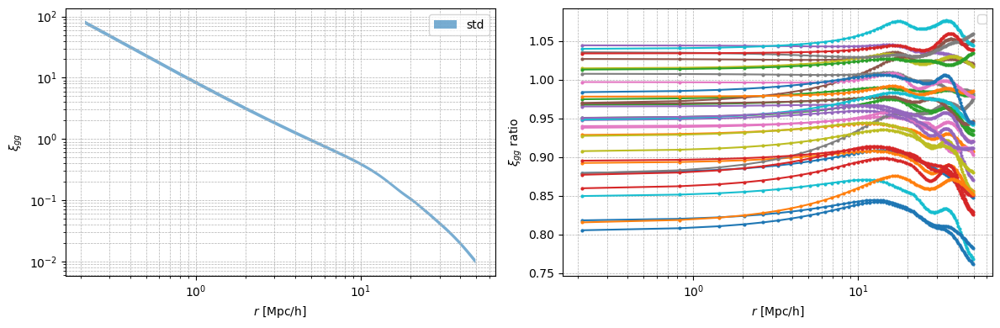

In [9]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].fill_between(r, all_xigg_preds.mean(axis=0) - all_xigg_preds.std(axis=0), all_xigg_preds.mean(axis=0) + all_xigg_preds.std(axis=0), alpha=0.6, label='std')
for i in range(1, all_xigg_preds.shape[0]):
    ax[1].plot(r, all_xigg_preds[i]/all_xigg_preds[0], marker='o', markersize=2)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].set_xscale('log')
ax[0].grid(which='both', linestyle='--', linewidth=0.5)
ax[1].grid(which='both', linestyle='--', linewidth=0.5)
ax[0].set_ylabel(r'$\xi_{gg}$')
ax[1].set_ylabel(r'$\xi_{gg}$ ratio')
ax[0].set_xlabel(r'$r$ [Mpc/h]')
ax[1].set_xlabel(r'$r$ [Mpc/h]')
ax[0].legend()
ax[1].legend()
fig.tight_layout()

#### $\xi_{gg}$ emulation error:

In [1]:
# Get the truth
## 1. Load the xi_Grid
import importlib
from gal_goku import plot
importlib.reload(plot)
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/xi_on_grid/'
train_subdir = 'train_less_massive'

plot_xi_emu = plot.PlotXiEmu(data_dir=data_dir, train_subdir=train_subdir)

2025-05-11 22:28:09.832631: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-11 22:28:09.835868: I external/local_xla/xla/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2025-05-11 22:28:09.845320: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747020489.861331  741983 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747020489.865976  741983 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1747020489.878590  741983 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linkin

Using 10 cores for parallel processing


2025-05-11 22:28:13.688662: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:28:13.731755: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:28:13.869867: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:28:14.101554: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:28:14.688762: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 80000000 exceeds 10% of free system memory.
2025-05-11 22:28:14.775131: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 79840000 e

In [2]:
## 2. Load hmf
# Get the truth
## 1. Load the xi_Grid
import importlib
from gal_goku import plot
importlib.reload(plot)
data_dir = '/home/qezlou/HD2/HETDEX/cosmo/data/'
train_subdir = 'HMF/train'
num_inducing = 500
num_latents = 20

plot_hmf_emu = plot.HmfCombined(data_dir=data_dir, train_subdir=train_subdir, num_inducing=num_inducing, num_latents=num_latents)

05/11/2025 10:29:26 PM Using 10 cores for parallel prediction
05/11/2025 10:29:26 PM Using 10 cores for parallel prediction
2025-05-11 22:29:26.655323: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:29:26.661964: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:29:26.663888: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:29:26.668890: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:29:26.668890: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Fail

In [3]:
## 2. Set the true p_grid
import numpy as np
import os
from multiprocessing import Pool
from gal_goku import gal
importlib.reload(gal)
from scipy.interpolate import make_interp_spline


def truth(s):
    """
    Get the truth for sim s
    """
    g = gal.Gal(logging_level='ERROR')
    g.reset_hod()
    g.tag_info = f'truth {s}'
    # Reser cosmo
    g.hmf = plot_hmf_emu.truth[s].squeeze()
    ind = np.where(np.isfinite(g.hmf))
    g.hmf = g.hmf[ind]
    g.log_dndlog_m_spl = make_interp_spline(np.log10(plot_hmf_emu.mbins)[ind], g.hmf)
    g.xi_grid = plot_xi_emu.truth[s].squeeze()
    # make the p_grid
    g.k, g.p_grid = g.xi_grid_to_p_grid()
    g.xi_hh_mth_bspline = None
    g.p_hh_mth_bspline = None
    return g

def pred(s):
    """
    Get the prediction for sim s
    """
    g = gal.Gal(logging_level='ERROR')
    g.reset_hod()
    g.tag_info = f'pred {s}'
    # Reser cosmo
    g.hmf = plot_hmf_emu.pred[s].squeeze()
    ind = np.where(np.isfinite(g.hmf))
    g.hmf = g.hmf[ind]
    g.log_dndlog_m_spl = make_interp_spline(np.log10(plot_hmf_emu.mbins)[ind], g.hmf)
    g.xi_grid = plot_xi_emu.pred[s].squeeze()
    # make the p_grid
    g.k, g.p_grid = g.xi_grid_to_p_grid()
    g.xi_hh_mth_bspline = None
    g.p_hh_mth_bspline = None
    return g


def _compare_pred_truth_xi_gg(s):
    """
    Compare the prediction and truth for xi_gg
    """
    g_truth = truth(s)
    g_pred = pred(s)
    r, xi_gg_truth = g_truth.get_xi_gg()
    _, xi_gg_pred = g_pred.get_xi_gg()
    return  r, xi_gg_truth, xi_gg_pred

def compare_pred_truth_xi_gg():
    """
    Compare the prediction and truth for xi_gg
    """
    sims = np.arange(36)
    sims = np.delete(sims, [6, 10, 13, 16, 18])
    # Determine the number of cores to use (leave some cores free)
    num_cores = max(1, os.cpu_count() - 2)
    print(f"Using {num_cores} cores for parallel processing")
    with Pool(num_cores) as p:
        results = p.map(_compare_pred_truth_xi_gg, sims)
    r = results[0][0]
    xi_gg_truth = np.array([result[1] for result in results])
    xi_gg_pred = np.array([result[2] for result in results])
    return r, xi_gg_truth, xi_gg_pred


In [4]:
r, all_xi_gg_truth, all_xi_gg_pred = compare_pred_truth_xi_gg()

Using 10 cores for parallel processing


2025-05-11 22:30:07.576737: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:30:07.576818: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:30:07.576818: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:30:07.576818: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:30:07.576824: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
2025-05-11 22:30:07.576818: E external/local_xla/xla/stream_executor/cuda/cuda_platfo

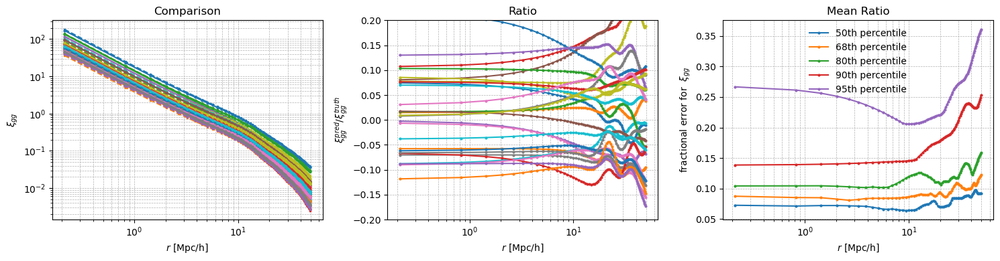

In [6]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(15, 4))
ratios = []
for s in range(len(all_xi_gg_truth)-1):
    ax[0].plot(r, all_xi_gg_truth[s], marker='o', markersize=2, label=r'$\xi_{gg}^{truth}$', color=f'C{s}')
    ax[0].plot(r, all_xi_gg_pred[s], marker='s', markersize=2, label=r'$\xi_{gg}^{pred}$', ls='--', color=f'C{s}')
    ratios.append(all_xi_gg_pred[s] / all_xi_gg_truth[s] - 1)
    ax[1].plot(r, ratios[-1], marker='o', markersize=2, label=r'$\xi_{gg}^{pred} / \xi_{gg}^{truth}$')

mean_ratio = np.mean(np.abs(ratios), axis=0)
std_ratio = np.std(np.abs(ratios), axis=0)
perc = [50, 68, 80, 90, 95]
percentile = np.percentile(np.abs(ratios), perc, axis=0)
for i, p in enumerate(perc):
    ax[2].plot(r, percentile[i], marker='o', markersize=2, label=f'{p}th percentile')

ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_ylabel(r'$\xi_{gg}$')
ax[0].set_xlabel(r'$r$ [Mpc/h]')
ax[0].set_title('Comparison')
ax[0].grid(which='both', linestyle='--', linewidth=0.5)


ax[1].set_ylabel(r'$\xi_{gg}^{pred} / \xi_{gg}^{truth}$')
ax[1].set_xlabel(r'$r$ [Mpc/h]')
ax[1].set_xscale('log')
ax[1].set_title('Ratio')
ax[1].set_ylim(-0.2, 0.2)
ax[1].grid(which='both', linestyle='--', linewidth=0.5)

ax[2].set_ylabel(r'fractional error for  $\xi_{gg}$')
ax[2].set_xlabel(r'$r$ [Mpc/h]')
ax[2].set_xscale('log')
ax[2].set_title('Mean Ratio')
ax[2].grid(which='both', linestyle='--', linewidth=0.5)
ax[2].legend(framealpha=0)

fig.tight_layout()

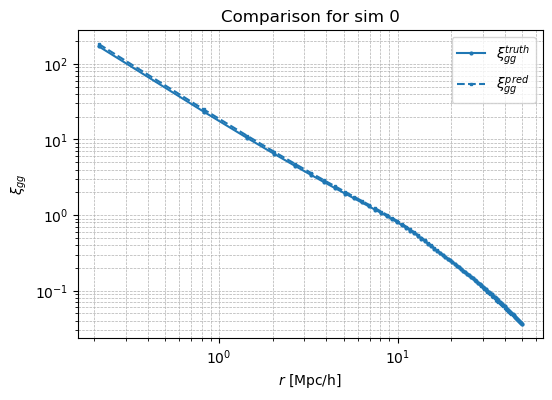

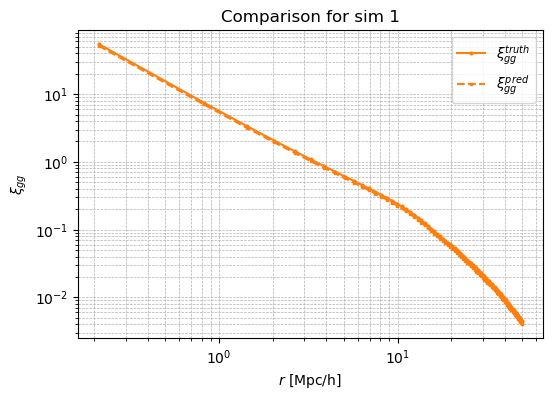

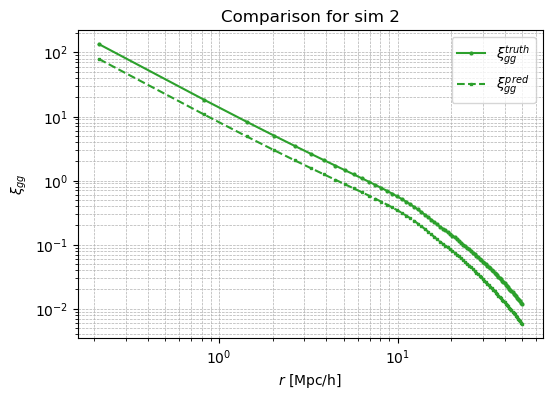

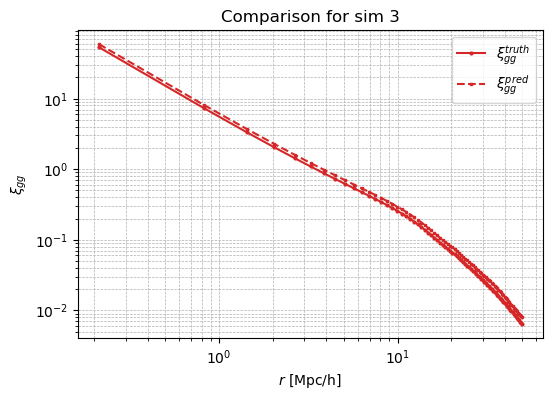

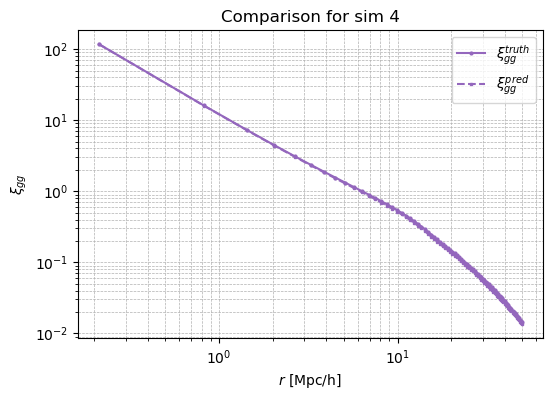

...

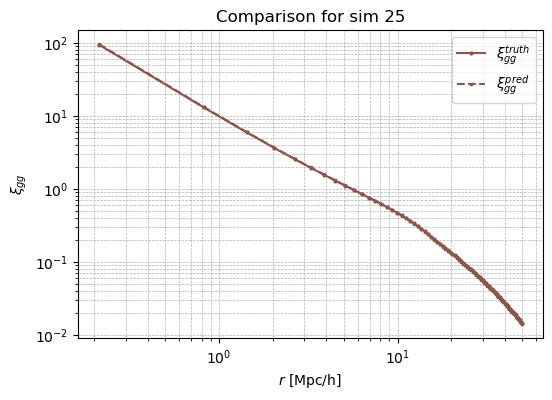

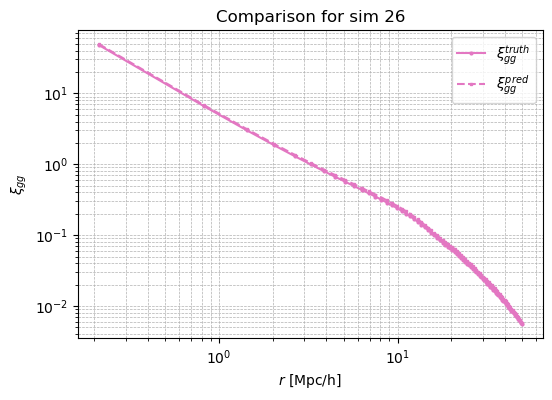

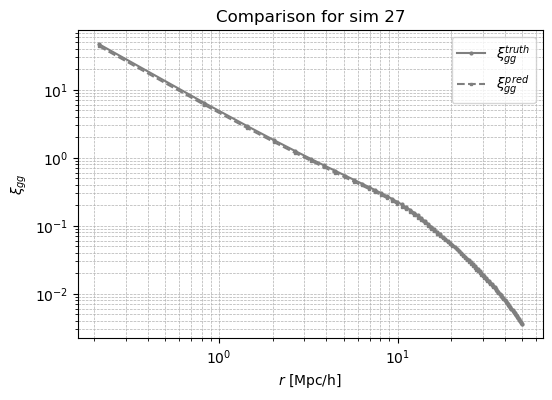

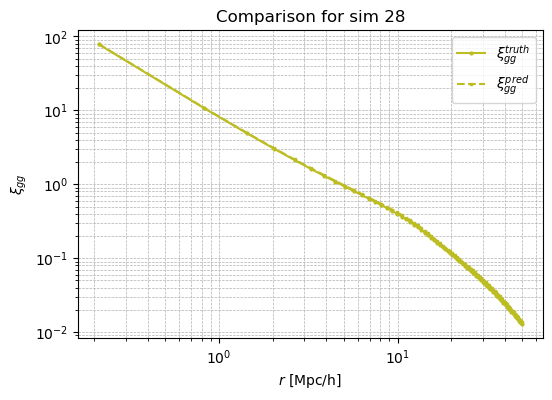

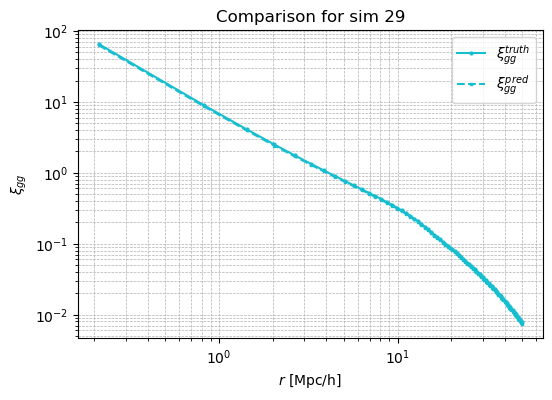

In [7]:
for s in range(len(all_xi_gg_truth)-1):
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    ax.plot(r, all_xi_gg_truth[s], marker='o', markersize=2, label=r'$\xi_{gg}^{truth}$', color=f'C{s}')
    ax.plot(r, all_xi_gg_pred[s], marker='s', markersize=2, label=r'$\xi_{gg}^{pred}$', ls='--', color=f'C{s}')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_ylabel(r'$\xi_{gg}$')
    ax.set_xlabel(r'$r$ [Mpc/h]')
    ax.set_title(f'Comparison for sim {s}')
    ax.grid(which='both', linestyle='--', linewidth=0.5)
    ax.legend()

## Cosmological sensitivity: